# Explore Given Data Set

In [1]:
import PIL
from PIL import Image
import os
import matplotlib.pyplot as plt
from glob import glob
import pandas as pd 
import numpy as np

project_path = os.path.normpath(os.path.join(os.getcwd(), '../'))
train_path = os.path.join(project_path, 'datasets/train/')
cells_path = os.path.join(project_path, 'datasets/cells/')

def get_meta(path, file_type, glob_col = "file_path"): 
    file_list = glob(os.path.join(path, f"*.{file_type}"))
    meta_df = pd.DataFrame(file_list, columns=[glob_col])
    meta_df["file_name"] = meta_df[glob_col].apply(lambda f: os.path.basename(f))
    meta_df["item_name"] = meta_df["file_name"].apply(lambda g: os.path.splitext(g)[0])
    
    return meta_df

train_tifs = glob(train_path + "*.tif")
cells_tifs = glob(cells_path + "*.tif")
cells_xmls = glob(cells_path + "*.xml")

train_labels = pd.read_csv(os.path.join(project_path, 'datasets/train_labels.csv'))

In [2]:
import re
cells_tif_meta = get_meta(cells_path, file_type="tif")
cells_tif_meta["base_name"] = cells_tif_meta["item_name"].apply(lambda x: "_".join(x.split("_")[:-1]))
cells_tif_meta["item_type"] = cells_tif_meta["item_name"].apply(lambda x: x.split("_")[-1])
cropped_cells_meta = cells_tif_meta[cells_tif_meta['item_type'] == 'crop']
masked_cells_meta = cells_tif_meta[cells_tif_meta['item_type'] == 'mask']

cells_xml_meta = get_meta(cells_path, file_type="xml")
cells_xml_meta["base_name"] = cells_xml_meta["item_name"].apply(lambda x:  "_".join(x.split("_")[:-1]))
cells_xml_meta.columns = [
    col + '_xml' 
    if col != 'base_name' else col
    for col in cells_xml_meta.columns
]

cells_meta = (
    cropped_cells_meta[['file_path', 'base_name']].merge(
        masked_cells_meta[['file_path', 'base_name']], 
        on='base_name', suffixes=['_crop', '_mask']
    ).merge(
        cells_xml_meta, 
        on='base_name', 
        how='outer', 
             suffixes = ["_tif", "_xml"]
    )
)
    
print(
    len(cells_meta), 
    len(cropped_cells_meta), 
    len(masked_cells_meta), 
    len(cells_xml_meta)
)
    
cells_meta 

154 154 154 154


,file_path_crop,base_name,file_path_mask,file_path_xml,file_name_xml,item_name_xml
0,/Users/trimchala/BreastPathQ/breastpathq/datas...,129_Region 1,/Users/trimchala/BreastPathQ/breastpathq/datas...,/Users/trimchala/BreastPathQ/breastpathq/datas...,129_Region 1_key.xml,129_Region 1_key
1,/Users/trimchala/BreastPathQ/breastpathq/datas...,4_Region 15,/Users/trimchala/BreastPathQ/breastpathq/datas...,/Users/trimchala/BreastPathQ/breastpathq/datas...,4_Region 15_key.xml,4_Region 15_key
2,/Users/trimchala/BreastPathQ/breastpathq/datas...,119_Region 15,/Users/trimchala/BreastPathQ/breastpathq/datas...,/Users/trimchala/BreastPathQ/breastpathq/datas...,119_Region 15_key.xml,119_Region 15_key
3,/Users/trimchala/BreastPathQ/breastpathq/datas...,144_Region 3,/Users/trimchala/BreastPathQ/breastpathq/datas...,/Users/trimchala/BreastPathQ/breastpathq/datas...,144_Region 3_key.xml,144_Region 3_key
4,/Users/trimchala/BreastPathQ/breastpathq/datas...,11_Region 4,/Users/trimchala/BreastPathQ/breastpathq/datas...,/Users/trimchala/BreastPathQ/breastpathq/datas...,11_Region 4_key.xml,11_Region 4_key
5,/Users/trimchala/BreastPathQ/breastpathq/datas...,153_Region 0,/Users/trimchala/BreastPathQ/breastpathq/datas...,/Users/trimchala/BreastPathQ/breastpathq/datas...,153_Region 0_key.xml,153_Region 0_key
6,/Users/trimchala/BreastPathQ/breastpathq/datas...,120_Region 17,/Users/trimchala/BreastPathQ/breastpathq/datas...,/Users/trimchala/BreastPathQ/breastpathq/datas...,120_Region 17_key.xml,120_Region 17_key
7,/Users/trimchala/BreastPathQ/breastpathq/datas...,64_Region 14,/Users/trimchala/BreastPathQ/breastpathq/datas...,/Users/trimchala/BreastPathQ/breastpathq/datas...,64_Region 14_key.xml,64_Region 14_key
8,/Users/trimchala/BreastPathQ/breastpathq/datas...,8_Region 4,/Users/trimchala/BreastPathQ/breastpathq/datas...,/Users/trimchala/BreastPathQ/breastpathq/datas...,8_Region 4_key.xml,8_Region 4_key
9,/Users/trimchala/BreastPathQ/breastpathq/datas...,150_Region 7,/Users/trimchala/BreastPathQ/breastpathq/datas...,/Users/trimchala/BreastPathQ/breastpathq/datas...,150_Region 7_key.xml,150_Region 7_key


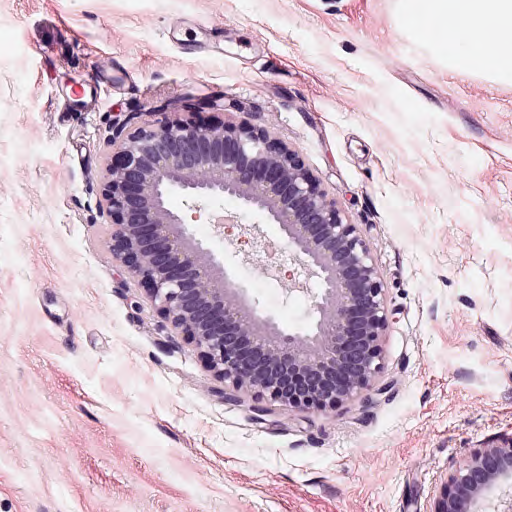

In [3]:
# Read train_image
tidx = np.random.randint(low=0, high=len(train_tifs), size=1)[0]
train_tif = train_tifs[tidx]
PIL.Image.open(train_tif)

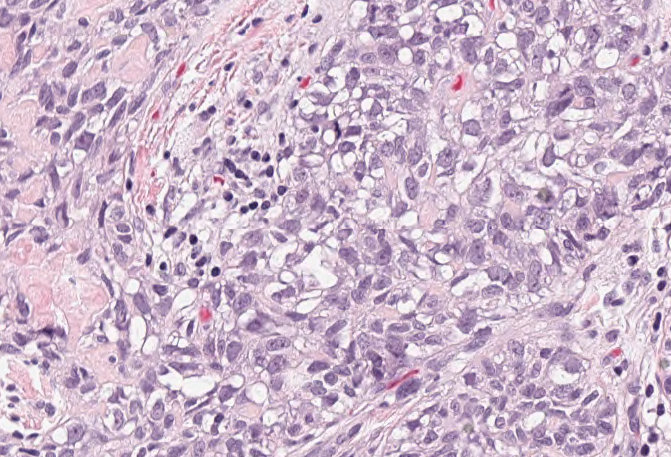

In [4]:
cidx = np.random.randint(low=0, high=len(cells_tifs), size=1)[0]
cells_tif = cells_tifs[cidx]
PIL.Image.open(cells_tif)

In [5]:
# Create cell mask from cells_tif
import xml.etree.ElementTree as ET
# First read in cell xml
def get_ptslist_from_str(xml_str, graphic_tag='graphic'): 
    elem_open_indices = [idx for (idx, line) in enumerate(xml_str) if f"<{graphic_tag}" in line]
    elem_close_indices = [idx for (idx, line) in enumerate(xml_str) if f"</{graphic_tag}" in line]
    
    elem_lines = [ 
        [l.strip() for l in xml_str[start:end+1]]
        for (start, end) in zip(elem_open_indices, elem_close_indices)
        ]
    
    return [ET.XML('\n'.join(elem_line)) for elem_line in elem_lines]

def get_pts_from_graphic(graphic_elem, point_list_tag="point-list"):
    
    point_list_elem = graphic_elem.findall("point-list")[0]
    
    pts_df = pd.DataFrame([
        [int(float(p)) for p in point_elem.text.split(",")] 
        for point_elem in point_list_elem
    ], columns=["x","y"])
    
    for key, val in graphic_elem.attrib.items(): 
        pts_df[key] = [val]*len(pts_df)

    return pts_df
 

In [6]:
import numpy as np
idx = np.random.randint(low=0, high=len(cells_xmls), size=1)[0]
with open(cells_xmls[idx], 'r') as f: 
    raw_xml = f.readlines()
    
graphic_list = get_ptslist_from_str(raw_xml, graphic_tag="graphic")

pts_dfs = pd.DataFrame()
for graphic_elem in graphic_list: 
    pts_df = get_pts_from_graphic(graphic_elem)
    pts_dfs = pd.concat([pts_dfs, pts_df], axis=0)

In [9]:
from tqdm import tqdm_notebook as tqdm
all_cells_regions_pts_dfs = pd.DataFrame()
for idx, row in tqdm(cells_xml_meta.iterrows(), total=len(cells_xml_meta)):
    with open(row['file_path_xml'], 'r') as f: 
        raw_xml = f.readlines()
        graphic_list = get_ptslist_from_str(raw_xml, graphic_tag="graphic")
    pts_dfs = pd.DataFrame()
    for graphic_elem in graphic_list: 
        pts_df = get_pts_from_graphic(graphic_elem)
        pts_dfs = pd.concat([pts_dfs, pts_df], axis=0)
        
    all_cells_regions_pts_dfs = pd.concat([all_cells_regions_pts_dfs, pts_dfs], axis=0)

In [12]:
# Visualize region with high vs. low cellularity
# train_labels['y'].hist(bins=30)
# all_cells_regions_pts_dfs.groupby(['name'])['x'].agg('count').hist(bins=25)

Text(0.5,1,'high cellularity: y=0.99, 99847_3.tif')

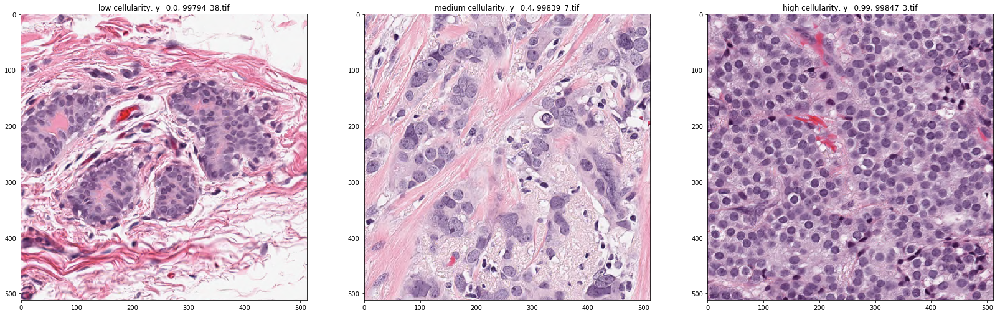

In [14]:
high_cellularity_labels = train_labels[train_labels['y'] >= 0.9]
medium_cellularity_labels = train_labels[(train_labels['y'] >= 0.35) & (train_labels['y'] <= 0.65)]
low_cellularity_labels = train_labels[train_labels['y'] <= 0.1]

hidx = np.random.randint(low=0, high=len(high_cellularity_labels), size=1)[0]
hrow = high_cellularity_labels.iloc[hidx]
hfile = os.path.join(train_path, f"{int(hrow['slide'])}_{int(hrow['rid'])}.tif")

midx = np.random.randint(low=0, high=len(medium_cellularity_labels), size=1)[0]
mrow = medium_cellularity_labels.iloc[midx]
mfile = os.path.join(train_path, f"{int(mrow['slide'])}_{int(mrow['rid'])}.tif")

lidx = np.random.randint(low=0, high=len(low_cellularity_labels), size=1)[0]
lrow = low_cellularity_labels.iloc[lidx]
lfile = os.path.join(train_path, f"{int(lrow['slide'])}_{int(lrow['rid'])}.tif")

fig, axes = plt.subplots(1, 3, figsize=(28, 9))
axes[0].imshow(plt.imread(lfile))
axes[0].set_title(f"low cellularity: y={lrow['y']}, {os.path.basename(lfile)}")
axes[1].imshow(plt.imread(mfile))
axes[1].set_title(f"medium cellularity: y={mrow['y']}, {os.path.basename(mfile)}")
axes[2].imshow(plt.imread(hfile))
axes[2].set_title(f"high cellularity: y={hrow['y']}, {os.path.basename(hfile)}")

In [16]:
# Explore cell data annotation
# Parse session xml
cells_session_path = os.path.join(cells_path, "Sedeen", "*")

from tqdm import tqdm_notebook as tqdm
all_sessions_regions_pts_dfs = pd.DataFrame()

for session_file in tqdm(glob(cells_session_path)):
    with open(session_file, 'r') as f: 
        raw_xml = f.readlines()
        graphic_list = get_ptslist_from_str(raw_xml, graphic_tag="graphic")
    
    pts_dfs = pd.DataFrame()
    for graphic_elem in graphic_list: 
        pts_df = get_pts_from_graphic(graphic_elem)
        pts_dfs = pd.concat([pts_dfs, pts_df], axis=0)
    
    pts_dfs['session_file'] = session_file
    all_sessions_regions_pts_dfs = pd.concat([all_sessions_regions_pts_dfs, pts_dfs], axis=0)
    

In [18]:
all_sessions_regions_pts_dfs.groupby(['name', 'description']).agg('count')
# all_sessions_regions_pts_dfs

x     y  type  session_file
name       description                                       
Region 1                         38    38    38            38
           IDC                  309   309   309           309
           normal               735   735   735           735
Region 10  IDC                  560   560   560           560
           TIL-E                 16    16    16            16
           TIL-S                 24    24    24            24
           normal              1367  1367  1367          1367
Region 11  IDC                  637   637   637           637
           MC- E                386   386   386           386
           TIL-S                348   348   348           348
           normal               240   240   240           240
Region 12  IDC                  291   291   291           291
           TIL-E                 47    47    47            47
           TIL-S                 11    11    11            11
           normal              1089  1089  1089          1089
Region 127                       90    90    90            90
Region 128                      127   127   127           127
Region 13  IDC                  732   732   732           732
           TIL-S                167   167   167           167
           normal                61    61    61            61
Region 14  Cellularity: 45(%)     1     1     1             1
           DCIS 3               241   241   241           241
           TIL-E                 22    22    22            22
           TIL-S                 45    45    45            45
           normal               509   509   509           509
Region 145 ILC                   62    62    62            62
Region 146 TIL-S                 15    15    15            15
Region 147 TIL-S                 14    14    14            14
Region 148 TIL-E                  3     3     3             3
Region 15  DCIS 2               329   329   329           329
...                             ...   ...   ...           ...
Region 7   TIL-S                228   228   228           228
Region 70  TIL-E                 11    11    11            11
Region 71  Cellularity: 40(%)     1     1     1             1
           TIL-S                197   197   197           197
Region 72  IDC                    5     5     5             5
Region 73  Cellularity: 10(%)     1     1     1             1
Region 75  Cellularity: 20(%)     1     1     1             1
Region 78  IDC                  109   109   109           109
Region 79  TIL-S                 12    12    12            12
Region 8   DCIS 2               243   243   243           243
           DCIS 3                93    93    93            93
           IDC                  337   337   337           337
           TIL-E                 53    53    53            53
           TIL-S                272   272   272           272
           normal              1151  1151  1151          1151
Region 80  TIL-E                  3     3     3             3
Region 82  IDC                  146   146   146           146
Region 83  TIL-S                 10    10    10            10
Region 84  TIL-E                  6     6     6             6
Region 85  Cellularity: 40(%)     1     1     1             1
           TIL-S                  3     3     3             3
Region 87  IDC                  127   127   127           127
Region 88  TIL-S                  9     9     9             9
Region 89  TIL-E                  3     3     3             3
Region 9   IDC                  190   190   190           190
           MC - M                95    95    95            95
           TIL-E                 26    26    26            26
           TIL-S                159   159   159           159
           normal               257   257   257           257
Region 91  DCIS 2               160   160   160           160

[141 rows x 4 columns]

In [22]:
all_sessions_regions_pts_dfs['base_name'] = all_sessions_regions_pts_dfs['session_file'].apply(lambda x: os.path.basename(x))

TypeError: Object does not appear to be a 8-bit string path or a Python file-like object

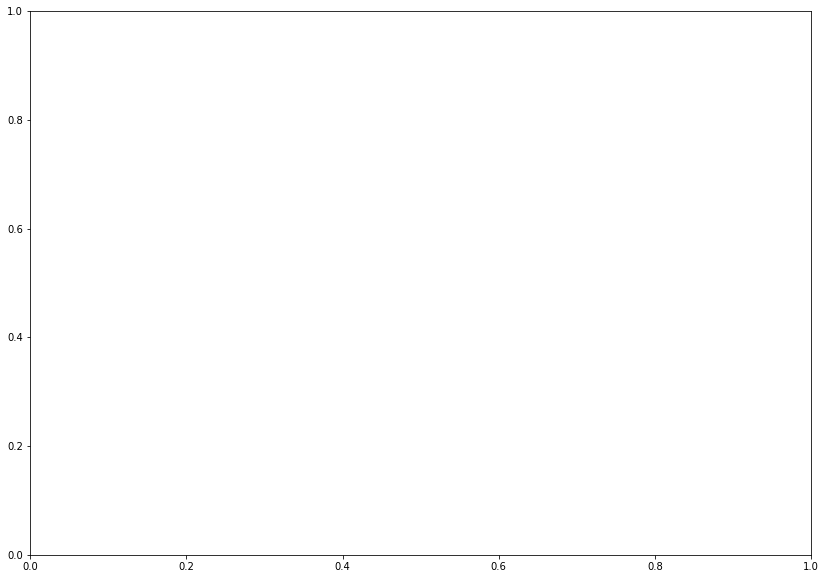

In [23]:
cells_meta_with_annorations = cells_meta.merge(
    all_sessions_regions_pts_dfs, on='base_name', 
    how='right'
)

region_with_cellularities = cells_meta_with_annorations[
    cells_meta_with_annorations['description'].apply(lambda x: x.startswith('Cellularity'))
]

cell_instance = np.random.choice(cells_meta_with_annorations['base_name'].unique(), 1)[0]
cell_df = cells_meta_with_annorations[cells_meta_with_annorations['base_name'] == cell_instance]

fig, ax = plt.subplots(figsize=(14, 10))
cell_img = plt.imread(cell_df['file_path_crop'].iloc[0])
plt.imshow(cell_img)
plt.plot(cell_df['x'], cell_df['y'], 'b*', color='limegreen')
# plt.title(cell_df['name'].values[0] + '_' + cell_df['description'].values[0])
plt.show()

# cell_df

In [24]:
cell_df

,file_path_crop,base_name,file_path_mask,file_path_xml,file_name_xml,item_name_xml,x,y,type,name,description,session_file
29016,NaN,95_Region 1_crop.session.xml,NaN,NaN,NaN,NaN,182,10,point,Region 2,IDC,/Users/trimchala/BreastPathQ/breastpathq/datas...
29017,NaN,95_Region 1_crop.session.xml,NaN,NaN,NaN,NaN,210,26,point,Region 2,IDC,/Users/trimchala/BreastPathQ/breastpathq/datas...
29018,NaN,95_Region 1_crop.session.xml,NaN,NaN,NaN,NaN,163,21,point,Region 2,IDC,/Users/trimchala/BreastPathQ/breastpathq/datas...
29019,NaN,95_Region 1_crop.session.xml,NaN,NaN,NaN,NaN,133,9,point,Region 2,IDC,/Users/trimchala/BreastPathQ/breastpathq/datas...
29020,NaN,95_Region 1_crop.session.xml,NaN,NaN,NaN,NaN,144,56,point,Region 2,IDC,/Users/trimchala/BreastPathQ/breastpathq/datas...
29021,NaN,95_Region 1_crop.session.xml,NaN,NaN,NaN,NaN,158,63,point,Region 2,IDC,/Users/trimchala/BreastPathQ/breastpathq/datas...
29022,NaN,95_Region 1_crop.session.xml,NaN,NaN,NaN,NaN,154,97,point,Region 2,IDC,/Users/trimchala/BreastPathQ/breastpathq/datas...
29023,NaN,95_Region 1_crop.session.xml,NaN,NaN,NaN,NaN,80,13,point,Region 2,IDC,/Users/trimchala/BreastPathQ/breastpathq/datas...
29024,NaN,95_Region 1_crop.session.xml,NaN,NaN,NaN,NaN,107,23,point,Region 2,IDC,/Users/trimchala/BreastPathQ/breastpathq/datas...
29025,NaN,95_Region 1_crop.session.xml,NaN,NaN,NaN,NaN,77,50,point,Region 2,IDC,/Users/trimchala/BreastPathQ/breastpathq/datas...


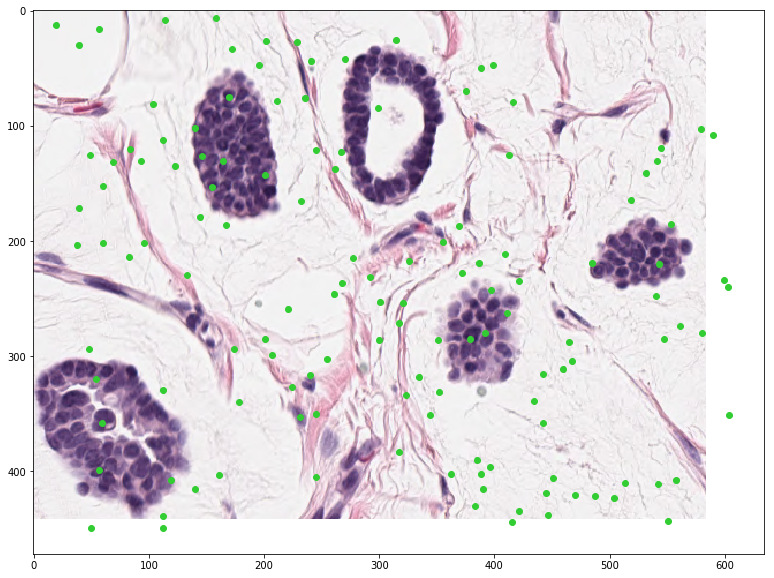

In [228]:
# Plot points over cells
# for idx, row in cells_meta.iterrows():
instance = cells_meta.sample(1).iloc[0]
cell_img = plt.imread(instance['file_path_crop'])
mask_img = plt.imread(instance['file_path_mask'])
with open(instance['file_path_xml'], 'r') as f: 
    raw_cell_xml = f.readlines()
    graphic_list = get_ptslist_from_str(raw_xml, graphic_tag="graphic")
    
    pts_dfs = pd.DataFrame()
    for graphic_elem in graphic_list: 
        pts_df = get_pts_from_graphic(graphic_elem)
        pts_dfs = pd.concat([pts_dfs, pts_df], axis=0)

fig, ax = plt.subplots(figsize=(14, 10))
plt.imshow(cell_img)
pts_dfs['x'] = pts_dfs['x'].astype(float)
pts_dfs['y'] = pts_dfs['y'].astype(float)
plt.plot(pts_dfs['x'], pts_dfs['y'], 'o', color='limegreen')
plt.show()

# Explore External DataSet MonuSeq

In [30]:
# Representation Learning for Nuclear Segmentation
# Use external data: /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/Annotations/
# https://monuseg.grand-challenge.org/Data/
# Predict on provided data in cells folder

# Read MoNuSeg Annotation:
monuseg_path = '/Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/'
monuseg_xmls = get_meta(os.path.join(monuseg_path, "Annotations"), file_type="xml")
monuseg_imgs = get_meta(os.path.join(monuseg_path, "TissueImages"), file_type="tif")
monuseg_meta = monuseg_xmls.merge(monuseg_imgs, on='item_name', suffixes=["_xml", "_tif"])

## Work with one cell data instance

In [38]:
def get_pts_from_regions(region_elem, vertex_tag="Vertex"):    
    vertices_elem = region_elem.findall("Vertices")[0].findall(vertex_tag)
    pts_df = pd.DataFrame([vertex_elem.attrib for vertex_elem in vertices_elem])
    pts_df.columns=['x', 'y']
    
    for key, val in region_elem.attrib.items(): 
        pts_df[key] = [val]*len(pts_df)

    return pts_df

# idx = np.random.randint(low=0, high=len(monuseg_meta), size=1)[0]
# row = monuseg_meta.iloc[idx]

# with open(row['file_path_xml'], 'r') as f: 
#     raw_nuc_xml = f.readlines()
    
# regions_elem = get_ptslist_from_str(xml_str=raw_nuc_xml, graphic_tag='Regions')
# region_elem_list = regions_elem[0].findall("Region")
# region_elem = region_elem_list[0]

# region_pts_dfs = pd.DataFrame()
# for region_elem in region_elem_list: 
#     region_pts_df = get_pts_from_regions(region_elem)
#     region_pts_dfs = pd.concat([region_pts_dfs, region_pts_df], axis=0)

In [11]:
# Compute centroid
region_pts_dfs = region_pts_dfs.drop_duplicates()
region_pts_dfs['x'] = region_pts_dfs['x'].astype(float)
region_pts_dfs['y'] = region_pts_dfs['y'].astype(float)
region_centroids = region_pts_dfs.groupby('Id')[['x', 'y']].agg(np.mean).reset_index()
# region_points = region_pts_dfs.groupby('Id').apply(lambda x: x.sample(frac=0.1)).reset_index()
region_points = region_pts_dfs.groupby('Id')[['x', 'y']].apply(lambda x: x.sample(frac=0.2))
print(len(region_centroids), len(region_points), len(region_pts_dfs))

378 20602 103003


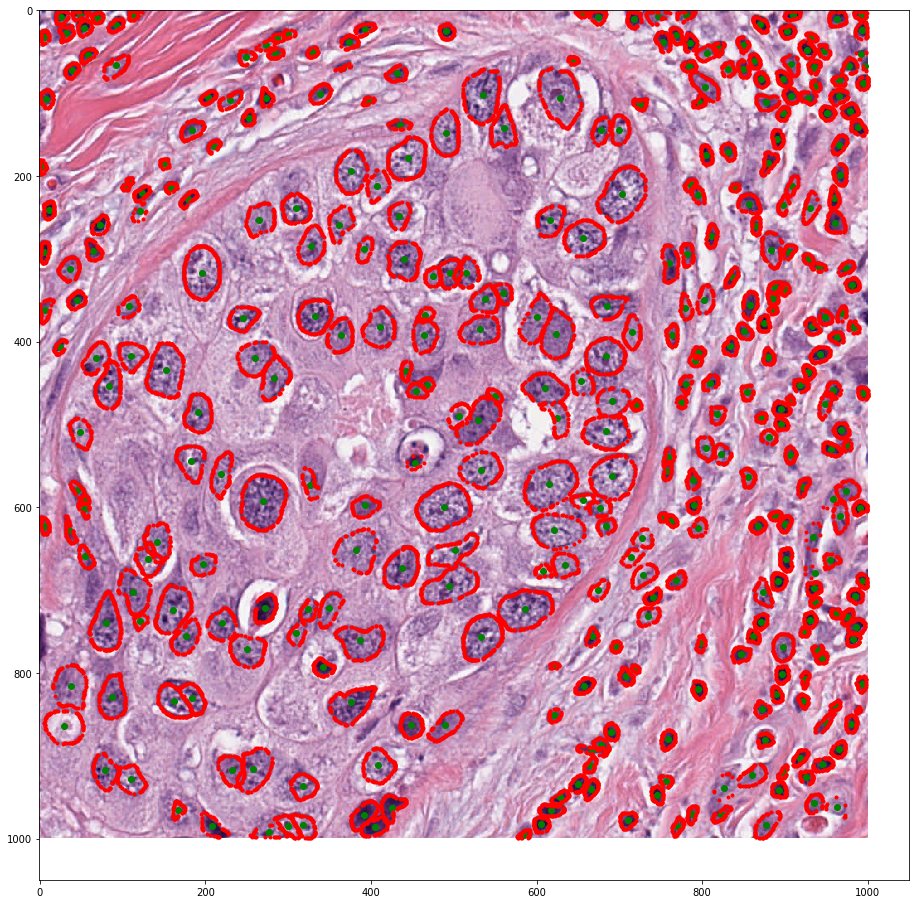

In [53]:
img = PIL.Image.open(row['file_path_tif'])
fig, ax = plt.subplots(figsize=(16, 16))
plt.imshow(img)
plt.plot(region_centroids['x'], region_centroids['y'], 'go')
plt.plot(region_points['x'], region_points['y'], 'r.')
plt.show()

In [21]:
num_regions = len(region_pts_dfs['Id'].unique())
nuc_mask = np.zeros((img.size[0], img.size[1], num_regions), dtype=float)
region_pts_dfs['Id'] = region_pts_dfs['Id'].astype(int)

In [46]:
from matplotlib.path import Path
from tqdm import tqdm_notebook as tqdm

x, y = np.meshgrid(np.arange(img.size[0]), np.arange(img.size[1])) # make a canvas with coordinates
x, y = x.flatten(), y.flatten()
points = np.vstack((x,y)).T 

num_regions = len(region_pts_dfs['Id'].unique())
nuc_mask = np.zeros((img.size[0], img.size[1], num_regions), dtype=float)
nuc_mask.shape

for idx, nuc_id in tqdm(enumerate(region_pts_dfs['Id'].unique()), total=num_regions): 
    grp = region_pts_dfs[region_pts_dfs['Id']==nuc_id]
    p = Path(list(zip(grp['x'], grp['y'])))
    grid = p.contains_points(points)
    mask = grid.reshape(img.size[0], img.size[1]).astype(int)
    nuc_mask[:, :, idx] = mask*idx
    
nuc_groundtruth = np.amax(nuc_mask, axis=2).astype(int)

Text(0.5,1,'labeled nuclei image TCGA-E2-A14V-01Z-00-DX1')

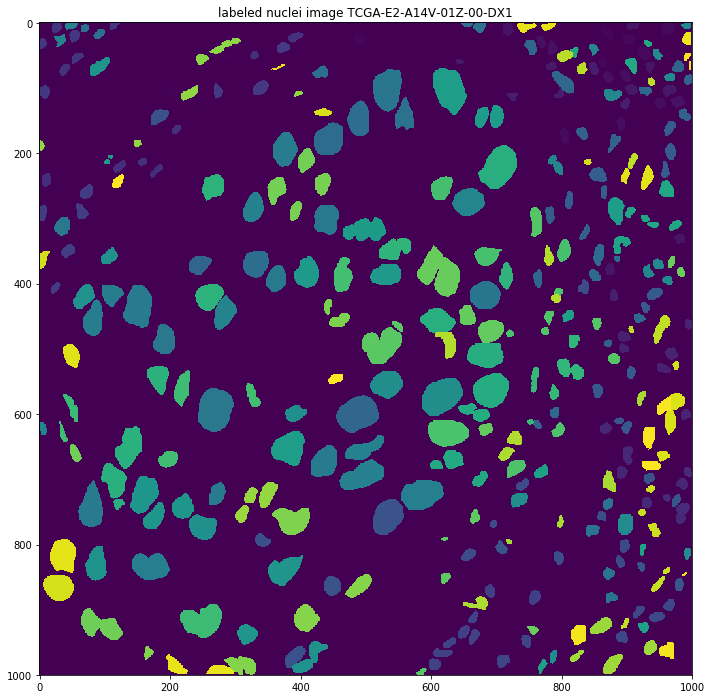

In [56]:
fig, ax = plt.subplots(figsize=(12, 12))
plt.imshow(nuc_groundtruth)
plt.title(f"labeled nuclei image {row['item_name']}")

In [31]:
def get_nuc_regions(raw_nuc_xml, graphic_tag='Regions', elem_tag="Region"):
    regions_elem = get_ptslist_from_str(xml_str=raw_nuc_xml, graphic_tag=graphic_tag)
    region_elem_list = regions_elem[0].findall(elem_tag)
    region_elem = region_elem_list[0]

    region_pts_dfs = pd.DataFrame()
    for region_elem in region_elem_list: 
        region_pts_df = get_pts_from_regions(region_elem)
        region_pts_dfs = pd.concat([region_pts_dfs, region_pts_df], axis=0)
    
    region_pts_dfs['x'] = region_pts_dfs['x'].astype(float)
    region_pts_dfs['y'] = region_pts_dfs['y'].astype(float)

    return region_pts_dfs

def get_bounded_pts(img, region_pts_dfs):
    x, y = np.meshgrid(np.arange(img.size[0]), np.arange(img.size[1])) # make a canvas with coordinates
    x, y = x.flatten(), y.flatten()
    points = np.vstack((x,y)).T 

    num_regions = len(region_pts_dfs['Id'].unique())
    nuc_mask = np.zeros((img.size[0], img.size[1], num_regions), dtype=float)

    for idx, nuc_id in tqdm(enumerate(region_pts_dfs['Id'].unique()), total=num_regions): 
        grp = region_pts_dfs[region_pts_dfs['Id']==nuc_id]
        p = Path(list(zip(grp['x'], grp['y'])))
        grid = p.contains_points(points)
        mask = grid.reshape(img.size[0], img.size[1]).astype(int)
        nuc_mask[:, :, idx] = mask*idx

    nuc_groundtruth = np.amax(nuc_mask, axis=2).astype(int)
    
    return nuc_groundtruth

In [40]:
from matplotlib.path import Path
from tqdm import tqdm_notebook as tqdm


instance = monuseg_meta.sample(1).iloc[0]

with open(instance['file_path_xml'], 'r') as f: 
    raw_nuc_xml = f.readlines()
    
region_pts_dfs = get_nuc_regions(raw_nuc_xml, graphic_tag='Regions', elem_tag="Region")
region_pts_dfs.groupby('Id')[['x', 'y']].agg(np.mean).reset_index()
region_centroids = region_pts_dfs.groupby('Id')[['x', 'y']].agg(np.mean).reset_index()


img = PIL.Image.open(instance['file_path_tif'])
nuc_groundtruth = get_bounded_pts(img, region_pts_dfs)

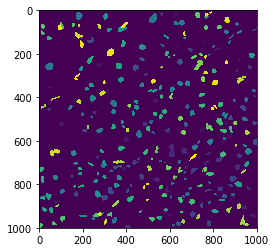

In [44]:
plt.imshow(nuc_groundtruth)

## Build Nuclei Segmentation Groundtruth from MoNuSeg Data Set

In [75]:
# Build MoNuSeg nuclei segmentation ground truth
# 1. Create metadata df
# Read MoNuSeg Annotation:
monuseg_path = '/Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/'
monuseg_xmls = get_meta(os.path.join(monuseg_path, "Annotations"), file_type="xml")
monuseg_imgs = get_meta(os.path.join(monuseg_path, "TissueImages"), file_type="tif")
monuseg_meta = monuseg_xmls.merge(monuseg_imgs, on='item_name', suffixes=["_xml", "_tif"])

# 2. Iterate through monuseg_meta
grouth_truth_img_path = os.path.join(monuseg_path, "LabeledNucImages")
centroid_output_path = os.path.join(monuseg_path, "NucCentroids")

for output_dir in [grouth_truth_img_path, centroid_output_path]:
    if not os.path.isdir(output_dir): 
        os.makedirs(output_dir)
    
for idx, instance in tqdm(monuseg_meta.iterrows(), total=len(monuseg_meta)):
    with open(instance['file_path_xml'], 'r') as f: 
        raw_nuc_xml = f.readlines()
        
    print(f"Parsing xml for {instance['item_name']}")
    region_pts_dfs = get_nuc_regions(raw_nuc_xml, graphic_tag='Regions', elem_tag="Region")
    region_pts_dfs.groupby('Id')[['x', 'y']].agg(np.mean).reset_index()
    region_centroids = region_pts_dfs.groupby('Id')[['x', 'y']].agg(np.mean).reset_index()
    # Save region centroids
    region_centroids.to_csv(os.path.join(centroid_output_path, f"{instance['item_name']}.csv"), index=False)
    
    print(f"Creating groundtruth image for {instance['item_name']}")
    img = PIL.Image.open(instance['file_path_tif'])
    nuc_groundtruth = get_bounded_pts(img, region_pts_dfs)
    
    output_file = os.path.join(grouth_truth_img_path, f"{instance['item_name']}.png")
    print(f"Saving labeled image to {output_file}")
    plt.imsave(output_file, nuc_groundtruth)

Parsing xml for TCGA-38-6178-01Z-00-DX1
Creating groundtruth image for TCGA-38-6178-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-38-6178-01Z-00-DX1.png
Parsing xml for TCGA-HE-7129-01Z-00-DX1
Creating groundtruth image for TCGA-HE-7129-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-HE-7129-01Z-00-DX1.png
Parsing xml for TCGA-A7-A13E-01Z-00-DX1
Creating groundtruth image for TCGA-A7-A13E-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-A7-A13E-01Z-00-DX1.png
Parsing xml for TCGA-HE-7128-01Z-00-DX1
Creating groundtruth image for TCGA-HE-7128-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-HE-7128-01Z-00-DX1.png
Parsing xml for TCGA-G9-6356-01Z-00-DX1
Creating groundtruth image for TCGA-G9-6356-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-G9-6356-01Z-00-DX1.png
Parsing xml for TCGA-AY-A8YK-01A-01-TS1
Creating groundtruth image for TCGA-AY-A8YK-01A-01-TS1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-AY-A8YK-01A-01-TS1.png
Parsing xml for TCGA-NH-A8F7-01A-01-TS1
Creating groundtruth image for TCGA-NH-A8F7-01A-01-TS1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-NH-A8F7-01A-01-TS1.png
Parsing xml for TCGA-G2-A2EK-01A-02-TSB
Creating groundtruth image for TCGA-G2-A2EK-01A-02-TSB


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-G2-A2EK-01A-02-TSB.png
Parsing xml for TCGA-HE-7130-01Z-00-DX1
Creating groundtruth image for TCGA-HE-7130-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-HE-7130-01Z-00-DX1.png
Parsing xml for TCGA-DK-A2I6-01A-01-TS1
Creating groundtruth image for TCGA-DK-A2I6-01A-01-TS1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-DK-A2I6-01A-01-TS1.png
Parsing xml for TCGA-A7-A13F-01Z-00-DX1
Creating groundtruth image for TCGA-A7-A13F-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-A7-A13F-01Z-00-DX1.png
Parsing xml for TCGA-E2-A1B5-01Z-00-DX1
Creating groundtruth image for TCGA-E2-A1B5-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-E2-A1B5-01Z-00-DX1.png
Parsing xml for TCGA-G9-6348-01Z-00-DX1
Creating groundtruth image for TCGA-G9-6348-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-G9-6348-01Z-00-DX1.png
Parsing xml for TCGA-G9-6336-01Z-00-DX1
Creating groundtruth image for TCGA-G9-6336-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-G9-6336-01Z-00-DX1.png
Parsing xml for TCGA-AR-A1AS-01Z-00-DX1
Creating groundtruth image for TCGA-AR-A1AS-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-AR-A1AS-01Z-00-DX1.png
Parsing xml for TCGA-CH-5767-01Z-00-DX1
Creating groundtruth image for TCGA-CH-5767-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-CH-5767-01Z-00-DX1.png
Parsing xml for TCGA-49-4488-01Z-00-DX1
Creating groundtruth image for TCGA-49-4488-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-49-4488-01Z-00-DX1.png
Parsing xml for TCGA-21-5784-01Z-00-DX1
Creating groundtruth image for TCGA-21-5784-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-21-5784-01Z-00-DX1.png
Parsing xml for TCGA-B0-5710-01Z-00-DX1
Creating groundtruth image for TCGA-B0-5710-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-B0-5710-01Z-00-DX1.png
Parsing xml for TCGA-50-5931-01Z-00-DX1
Creating groundtruth image for TCGA-50-5931-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-50-5931-01Z-00-DX1.png
Parsing xml for TCGA-B0-5711-01Z-00-DX1
Creating groundtruth image for TCGA-B0-5711-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-B0-5711-01Z-00-DX1.png
Parsing xml for TCGA-E2-A14V-01Z-00-DX1
Creating groundtruth image for TCGA-E2-A14V-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-E2-A14V-01Z-00-DX1.png
Parsing xml for TCGA-KB-A93J-01A-01-TS1
Creating groundtruth image for TCGA-KB-A93J-01A-01-TS1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-KB-A93J-01A-01-TS1.png
Parsing xml for TCGA-RD-A8N9-01A-01-TS1
Creating groundtruth image for TCGA-RD-A8N9-01A-01-TS1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-RD-A8N9-01A-01-TS1.png
Parsing xml for TCGA-AR-A1AK-01Z-00-DX1
Creating groundtruth image for TCGA-AR-A1AK-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-AR-A1AK-01Z-00-DX1.png
Parsing xml for TCGA-G9-6362-01Z-00-DX1
Creating groundtruth image for TCGA-G9-6362-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-G9-6362-01Z-00-DX1.png
Parsing xml for TCGA-G9-6363-01Z-00-DX1
Creating groundtruth image for TCGA-G9-6363-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-G9-6363-01Z-00-DX1.png
Parsing xml for TCGA-B0-5698-01Z-00-DX1
Creating groundtruth image for TCGA-B0-5698-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-B0-5698-01Z-00-DX1.png
Parsing xml for TCGA-18-5592-01Z-00-DX1
Creating groundtruth image for TCGA-18-5592-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-18-5592-01Z-00-DX1.png
Parsing xml for TCGA-21-5786-01Z-00-DX1
Creating groundtruth image for TCGA-21-5786-01Z-00-DX1


Saving labeled image to /Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages/TCGA-21-5786-01Z-00-DX1.png


# Try Pytorch UNet

In [26]:
# Split data set into training/validation/testing
import cv2
from PIL import Image
dataset_path = '/Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining'
image_path = os.path.join(dataset_path, 'TissueImages')
mask_path = os.path.join(dataset_path, 'LabeledNucImages')
centroid_path = os.path.join(dataset_path, "NucCentroids")

cell_image_meta = get_meta(path=image_path, file_type="tif")
mask_meta = get_meta(path=mask_path, file_type="png")
centroid_meta = get_meta(path=centroid_path, file_type="csv")

image_with_mask_meta = cell_image_meta.merge(mask_meta, on='item_name', suffixes=['_image', '_mask'])
image_mask_centroid_meta = image_with_mask_meta.merge(centroid_meta, on='item_name')
row = image_mask_centroid_meta.sample(1).iloc[0]

image =  cv2.imread(row['file_path_image'])
mask = cv2.imread(row['file_path_mask'])
centroid_df = pd.read_csv(row['file_path'])

# fig, axes = plt.subplots(1, 2, figsize=(11, 7))
# axes[0].imshow(image)
# axes[1].imshow(mask[:, :, :3])

In [25]:
# def 
from skimage import data, color

def crop_image_and_mask(image, mask, centroid_df, num_grid = 4, item_name="unknown", display_crop=False): 
    image_w, image_h, image_c = image.shape
    mask_w, mask_h, _ = mask.shape

    x = np.linspace(0, image_w, num_grid).astype(int)
    y = np.linspace(0, image_h, num_grid).astype(int)

    image_crops = []
    mask_crops = []
    centroid_crops = []
    for x1, x2 in zip(x[:-1], x[1:]): 
        for y1, y2 in zip(y[:-1], y[1:]):
            image_crops.append(image[x1:x2, y1:y2, :])
            mask_crops.append(mask[x1:x2, y1:y2])
            
            adjusted_centroid_df = centroid_df.apply(
                    lambda row: 
                        (x1 < row['x'] <= x2) and (y1 < row['y'] <= y2), 
                    axis=1
                ).reset_index(drop=True)
            
            adjusted_centroid_df = centroid_df[
                centroid_df.apply(
                    lambda row: (x1 < row['x'] <= x2) and (y1 < row['y'] <= y2), axis=1)
            ].reset_index(drop=True)
            adjusted_centroid_df['x'] = adjusted_centroid_df['x'] - x1
            adjusted_centroid_df['y'] = adjusted_centroid_df['y'] - y1            

            centroid_crops.append(adjusted_centroid_df)

    if display_crop: 
        sidx = np.random.randint(low=0, high=len(image_crops), size=1)[0]
        image_hsv = color.rgb2hsv(image_crops[sidx])
        mask_hsv = mask_crops[sidx]
        mask_hsv = (mask_crops[sidx][:, :, :3] > np.min(mask_crops[sidx][:, :, :3])).astype(int)

        alpha=0.5
        image_hsv[..., 0] = mask_hsv[..., 0] * (1-alpha)
        image_hsv[..., 1] = mask_hsv[..., 1] * alpha

        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        axes[0].imshow(image_crops[sidx])
        axes[1].imshow(mask_crops[sidx])
        axes[2].imshow(color.hsv2rgb(image_hsv))
        
        plt.suptitle(f'cropped_{item_name}_subregion_{sidx}')

        plt.show()
    
    return image_crops, mask_crops, centroid_crops

image_crops, mask_crops, centroid_crops = crop_image_and_mask(
    image, 
    mask, 
    centroid_df,
    item_name = row['item_name'], 
    display_crop=True, 
    num_grid=4
)

NameError: name 'image' is not defined

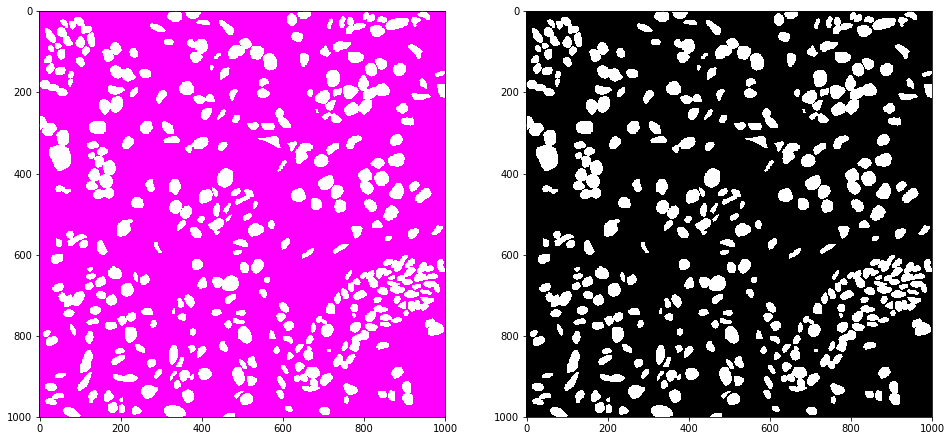

In [80]:
mask = cv2.imread(row['file_path_mask'])
retval, mask = cv2.threshold(mask, 10, 255, cv2.THRESH_BINARY)
gray = cv2.cvtColor(mask, cv2.COLOR_RGB2GRAY)
gray.min(), gray.max()
fig, axes = plt.subplots(1, 2, figsize=(16, 8))
axes[0].imshow(mask, cmap='gray')
axes[1].imshow(gray, cmap='gray')

# gray[np.where(gray == gray.min())] = 0

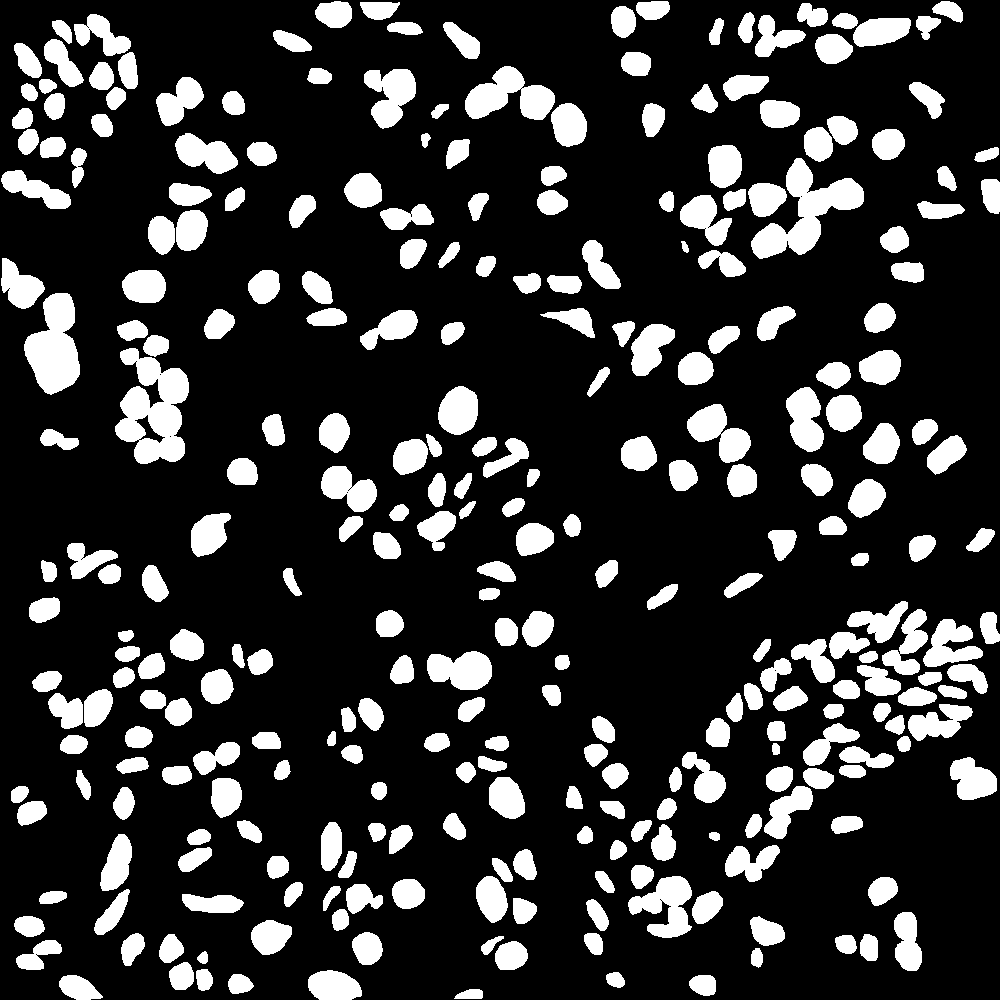

In [81]:
gray2 = gray - gray.min()
gray2[np.where(gray2 == gray2.max())] = 255 
PIL.Image.fromarray(gray2)

0.8 0.09999999999999998 0.09999999999999998


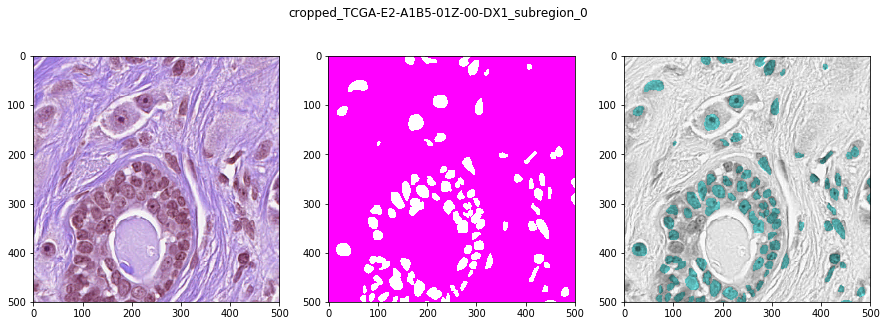

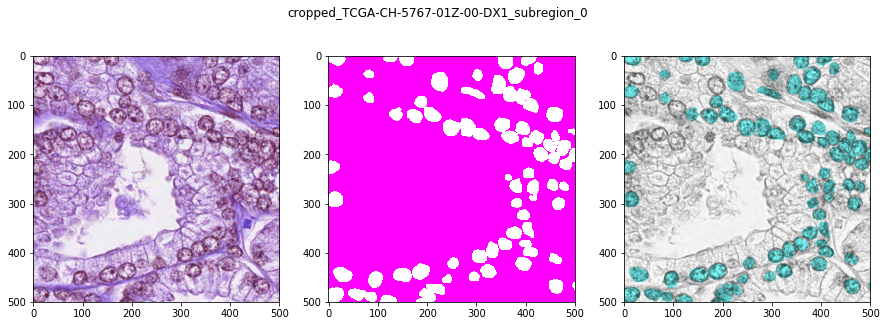

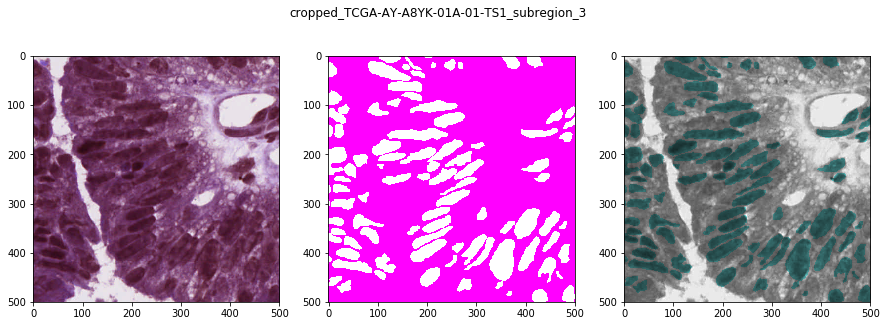

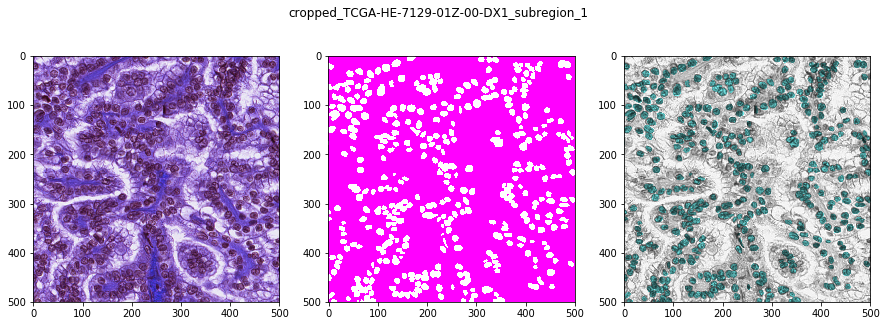

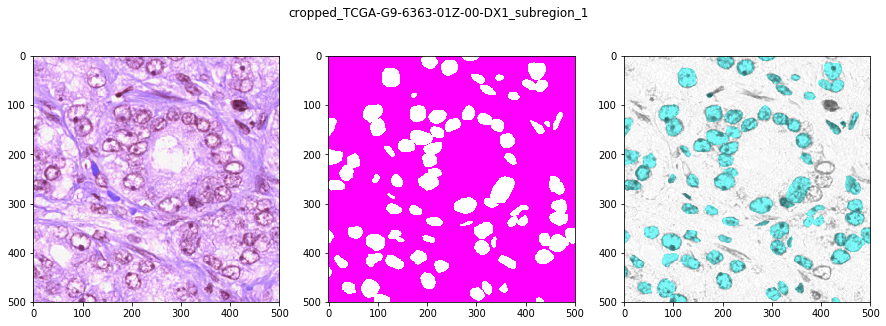

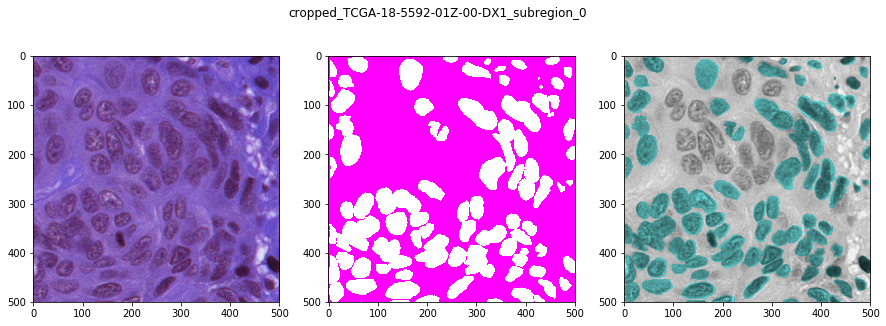

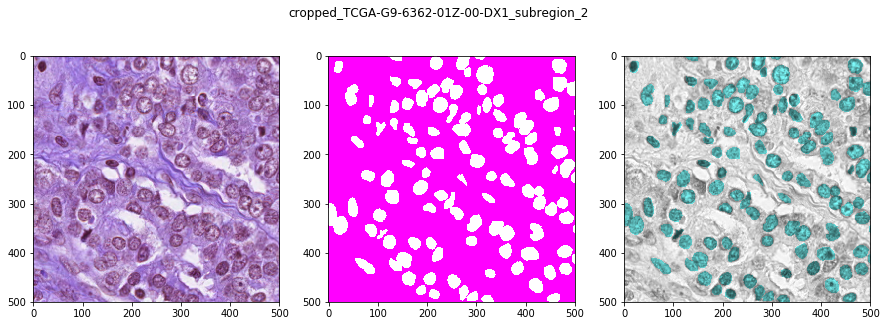

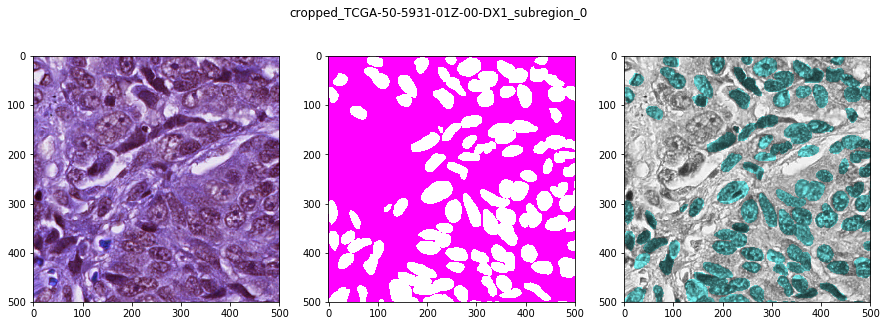

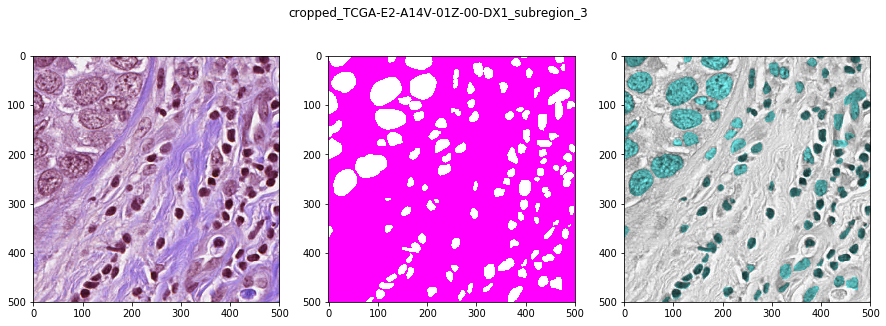

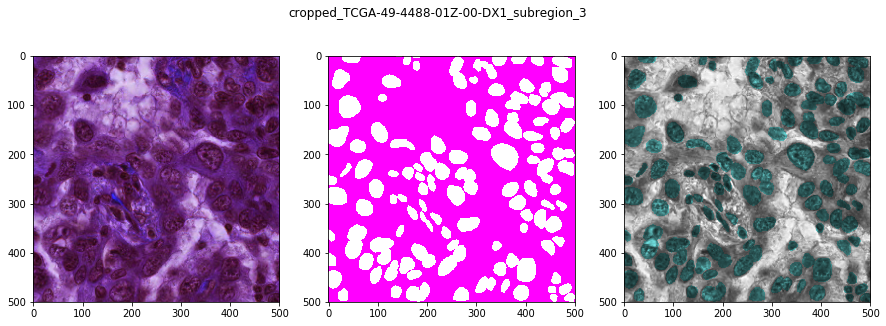

In [53]:
# Also need to crop centroids
# centroid_meta . . . 
monuseg_path = '/Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/'
grouth_truth_img_path = os.path.join(monuseg_path, "LabeledNucImages")
centroid_output_path = os.path.join(monuseg_path, "NucCentroids")

display_rate = 0.3
random_display = np.array([(r > (1-display_rate)) for r in np.random.random(len(image_with_mask_meta))])

num_grid = 3
frac_train = 0.8
frac_validation = 0.5*(1 - frac_train)
frac_test = 1 - frac_train - frac_validation
print(frac_train, frac_validation, frac_test)

for (idx, row), display_flag in tqdm(zip(image_mask_centroid_meta.iterrows(), random_display), total=len(image_with_mask_meta)): 
    image = cv2.imread(row['file_path_image'])
    mask_rgb = cv2.imread(row['file_path_mask'])

    retval, mask = cv2.threshold(mask_rgb, 10, 255, cv2.THRESH_BINARY)
    mask_gray = cv2.cvtColor(mask, cv2.COLOR_RGB2GRAY)
#     mask_gray = mask_gray - mask_gray.min()
#     mask_gray[np.where(mask_gray == mask_gray.max())] = 255 
    
    centroid_df = pd.read_csv(row['file_path'])
    image_crops, mask_crops, centroid_crops = crop_image_and_mask(
        image, mask, centroid_df, item_name=row['item_name'], display_crop=display_flag, num_grid=num_grid
    )
    
    ml_set = np.random.choice(
        ['train', 'validation', 'test'], 
        replace=True, 
        p=[frac_train, frac_validation, frac_test], 
        size=len(image_crops)
    )
    
    # Save to different ml_set
    for (idx, image_crop), mask_crop, centroid_crop, set_name in zip(enumerate(image_crops), mask_crops, centroid_crops, ml_set): 
        img_crop_out_path = os.path.join(image_path, set_name)
        mask_crop_out_path = os.path.join(mask_path, set_name)
        centroid_crop_out_path = os.path.join(centroid_output_path, set_name)
        
        for ml_set_path in [img_crop_out_path, mask_crop_out_path, centroid_crop_out_path]:             
            if not os.path.isdir(ml_set_path): 
                os.makedirs(ml_set_path)
        
        plt.imsave(os.path.join(img_crop_out_path, f"{row['item_name']}_{idx}.tif"), image_crop)
        plt.imsave(os.path.join(mask_crop_out_path, f"{row['item_name']}_{idx}.png"), PIL.Image.fromarray(mask_crop))
        centroid_crop.to_csv(os.path.join(centroid_crop_out_path, f"{row['item_name']}_{idx}.csv"), index=False)
        

In [56]:
print(
    len(glob(os.path.join(grouth_truth_img_path, "train", "*"))), 
    len(glob(os.path.join(grouth_truth_img_path, "validation", "*"))),
    len(glob(os.path.join(grouth_truth_img_path, "test", "*")))
)

99 15 21


In [55]:
grouth_truth_img_path

'/Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining/LabeledNucImages'

In [158]:
# cells_path = '/Users/trimchala/BreastPathQ/breastpathq/datasets/cells/'
# !ulimit -n 10000

In [70]:
import torch
import torch.nn as nn
from torch.nn import Conv2d as Conv2D
import torch.nn.init as init
import torch.nn.functional as F
import numpy
from torch.nn import Upsample
from tqdm import tqdm_notebook as tqdm

class Up(nn.Module):
    def __init__(self, channel_in, channel_out):
        super(Up, self).__init__()
        self.upsample = nn.Upsample(scale_factor=2, mode='bilinear')
        self.conv = nn.Sequential(
            Conv2D(channel_in, channel_out, kernel_size = 3, padding = 1),
            nn.BatchNorm2d(channel_out),
            nn.ReLU(inplace=True)
        )

        
        
    def forward(self, x1, x2):
        # Input size - Batch_Size X Channel X Height of Activation Map  X Width of Activation Map
        # Upsample using bilinear mode and scale it to twice its size
        x1 = self.upsample(x1)
        # in 4D array - matching the last two in case of 5D it will take 
        # last three dimensions
        difference_in_X = x1.size()[2] - x2.size()[2]
        difference_in_Y = x1.size()[3] - x2.size()[3]
        # Padding it with the required value
        x2 = F.pad(x2, (difference_in_X // 2, int(difference_in_X / 2),
                        difference_in_Y // 2, int(difference_in_Y / 2)))
        # concat on channel axis
        x = torch.cat([x2, x1], dim=1)
        # Use convolution
        x = self.conv(x)
        return x

class Down(nn.Module):
    def __init__(self, channel_in, channel_out):
        super(Down, self).__init__()
        self.conv = nn.Sequential(
            Conv2D(channel_in, channel_out, kernel_size = 3, padding = 1),
            nn.BatchNorm2d(channel_out),
            nn.ReLU(inplace=True)
        )
    
    def forward(self, x):
        # Input size - Batch_Size X Channel X Height of Activation Map  X Width of Activation Map
        # Downsample First
        x = F.max_pool2d(x,2)
        # Use convolution
        x = self.conv(x)
        return x

class UNet(nn.Module):
    def __init__(self, channel_in, classes):
        super(UNet, self).__init__()
        self.input_conv = self.conv = nn.Sequential(
            Conv2D(channel_in, 8, kernel_size = 3, padding = 1),
            nn.BatchNorm2d(8),
            nn.ReLU(inplace=True)
        )
        self.down1 = Down(8, 16)
        self.down2 = Down(16, 32)
        self.down3 = Down(32, 32)
        self.up1 = Up(64, 16)
        self.up2 = Up(32, 8)
        self.up3 = Up(16, 4)
        self.output_conv = nn.Conv2d(4, classes, kernel_size = 1)
        
    def forward(self, x):
        x1 = self.input_conv(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x = self.up1(x4, x3)
        x = self.up2(x, x2)
        x = self.up3(x, x1)
        output = self.output_conv(x)
        return F.sigmoid(output)
    
def weights_init(m):
    if isinstance(m, nn.Conv2d):
        init.xavier_uniform(m.weight, gain=numpy.sqrt(2.0))
        init.constant(m.bias, 0.1)
    
def train_unet(model, epoch, train_dataloader):
    model.train()
    correct = 0
    for batch_idx, data in tqdm(enumerate(train_dataloader), total=len(train_dataloader)):
        data, target = Variable(data["image"]), Variable(data["mask"])
        optimizer.zero_grad()
        output = model.forward(data.float())
        loss = criterion(output.float(), target.float())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        if batch_idx % 1 == 0:
            print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                epoch, batch_idx * len(data), len(train_dataloader.dataset),
                100. * batch_idx / len(train_dataloader), loss.data[0]))
            
def test_unet(model, val_dataloader):
    model.eval()
    test_loss = 0
    for data in tqdm(val_dataloader):
        data, target = Variable(data["image"], volatile=True), Variable(data["mask"])
        output = model(data.float())
        # print(output.data[0])
        test_loss += criterion(output.float(), target.float()).data[0] # sum up batch loss
    test_loss /= len(val_dataloader.dataset)
    print("Average Loss: ", test_loss)

In [64]:
# Data Augmentation 
# Random Crop
# Random Flip

import skimage
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, utils
from torch.autograd import Variable
from torch.utils.data.dataset import Dataset
from torchvision import transforms
from torchvision.transforms import Compose, TenCrop, Lambda
import torchvision.transforms as vis_tf
from glob import glob
import cv2
from matplotlib import pyplot as plt
%matplotlib inline
# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

%load_ext autoreload

%autoreload 2
plt.ion()   # interactive mode

dataset_path = '/Users/trimchala/BreastPathQ/breastpathq/datasets/MoNuSegTraining'
image_path = os.path.join(dataset_path, 'TissueImages')
mask_path = os.path.join(dataset_path, 'LabeledNucImages')

class NuclearMaskedDataSet(Dataset): 
    def __init__(self, image_path, mask_path, transforms=None):
        # stuff
        self.image_path = image_path
        self.mask_path = mask_path
        self.transforms = transforms
        self.image_list = glob(os.path.join(self.image_path, "*.tif"))
        self.mask_list = glob(os.path.join(self.mask_path, "*.png"))
        
    def __getitem__(self, index):
        img = PIL.Image.fromarray(cv2.imread(self.image_list[index]))
        mask = PIL.Image.fromarray(cv2.imread(self.mask_list[index]))

        # Transform only on training set
        if self.transforms is not None:
            img = self.transforms(img)
            mask = self.transforms(mask)
            
        return {
            "image": img, 
            "mask": mask
        }

    def __len__(self):
        return len(self.image_list)
    
crop_size = 256
crop_padding = 4
transformations = vis_tf.Compose([
    vis_tf.RandomHorizontalFlip(),
    vis_tf.RandomVerticalFlip(),
    vis_tf.RandomCrop(size=crop_size, padding=crop_padding), 
    vis_tf.ToTensor()
])

train_ds = NuclearMaskedDataSet(
    image_path=os.path.join(image_path, "train"), 
    mask_path=os.path.join(mask_path, "train"),
    transforms=transformations
)

val_ds = NuclearMaskedDataSet(
    image_path=os.path.join(image_path, "validation"),
    mask_path=os.path.join(mask_path, "validation"), 
    transforms=None
)

test_ds = NuclearMaskedDataSet(
    image_path=os.path.join(image_path, "test"), 
    mask_path=os.path.join(mask_path, "test"), 
    transforms=None
)

batch_size = 32
train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_ds, batch_size=batch_size, shuffle=True, num_workers=4)
test_loader = DataLoader(test_ds, batch_size=batch_size, shuffle=True, num_workers=4)

model_instance = UNet(3, 3)
optimizer = optim.Adam(model_instance.parameters(), lr=0.0001)
criterion = nn.BCELoss()
    
epoches = 100
for epoch in range(epoches):
    train_unet(model=model_instance, epoch=epoch, train_dataloader=train_loader)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Train Epoch: 0 [0/99 (0%)]	Loss: 0.750482
Train Epoch: 0 [32/99 (25%)]	Loss: 0.748941
Train Epoch: 0 [64/99 (50%)]	Loss: 0.745079
Train Epoch: 0 [9/99 (75%)]	Loss: 0.745681


Train Epoch: 1 [0/99 (0%)]	Loss: 0.748716
Train Epoch: 1 [32/99 (25%)]	Loss: 0.749382
Train Epoch: 1 [64/99 (50%)]	Loss: 0.750541
Train Epoch: 1 [9/99 (75%)]	Loss: 0.744584


Train Epoch: 2 [0/99 (0%)]	Loss: 0.746086
Train Epoch: 2 [32/99 (25%)]	Loss: 0.744082
Train Epoch: 2 [64/99 (50%)]	Loss: 0.744674
Train Epoch: 2 [9/99 (75%)]	Loss: 0.745825


Train Epoch: 3 [0/99 (0%)]	Loss: 0.747312
Train Epoch: 3 [32/99 (25%)]	Loss: 0.744855
Train Epoch: 3 [64/99 (50%)]	Loss: 0.746061
Train Epoch: 3 [9/99 (75%)]	Loss: 0.739496


Train Epoch: 4 [0/99 (0%)]	Loss: 0.747275
Train Epoch: 4 [32/99 (25%)]	Loss: 0.743984
Train Epoch: 4 [64/99 (50%)]	Loss: 0.744841
Train Epoch: 4 [9/99 (75%)]	Loss: 0.740872


Train Epoch: 5 [0/99 (0%)]	Loss: 0.744035
Train Epoch: 5 [32/99 (25%)]	Loss: 0.744687
Train Epoch: 5 [64/99 (50%)]	Loss: 0.742851
Train Epoch: 5 [9/99 (75%)]	Loss: 0.741275


Train Epoch: 6 [0/99 (0%)]	Loss: 0.744736
Train Epoch: 6 [32/99 (25%)]	Loss: 0.741035
Train Epoch: 6 [64/99 (50%)]	Loss: 0.743887
Train Epoch: 6 [9/99 (75%)]	Loss: 0.743419


Train Epoch: 7 [0/99 (0%)]	Loss: 0.744546
Train Epoch: 7 [32/99 (25%)]	Loss: 0.743337
Train Epoch: 7 [64/99 (50%)]	Loss: 0.744088
Train Epoch: 7 [9/99 (75%)]	Loss: 0.739772


Train Epoch: 8 [0/99 (0%)]	Loss: 0.741366
Train Epoch: 8 [32/99 (25%)]	Loss: 0.743402
Train Epoch: 8 [64/99 (50%)]	Loss: 0.742673
Train Epoch: 8 [9/99 (75%)]	Loss: 0.739956


Train Epoch: 9 [0/99 (0%)]	Loss: 0.743083
Train Epoch: 9 [32/99 (25%)]	Loss: 0.746812
Train Epoch: 9 [64/99 (50%)]	Loss: 0.741390
Train Epoch: 9 [9/99 (75%)]	Loss: 0.740667


Train Epoch: 10 [0/99 (0%)]	Loss: 0.742378
Train Epoch: 10 [32/99 (25%)]	Loss: 0.742559
Train Epoch: 10 [64/99 (50%)]	Loss: 0.742645
Train Epoch: 10 [9/99 (75%)]	Loss: 0.743019


Train Epoch: 11 [0/99 (0%)]	Loss: 0.743086
Train Epoch: 11 [32/99 (25%)]	Loss: 0.743091
Train Epoch: 11 [64/99 (50%)]	Loss: 0.741566
Train Epoch: 11 [9/99 (75%)]	Loss: 0.742059


Train Epoch: 12 [0/99 (0%)]	Loss: 0.739710
Train Epoch: 12 [32/99 (25%)]	Loss: 0.742612
Train Epoch: 12 [64/99 (50%)]	Loss: 0.740763
Train Epoch: 12 [9/99 (75%)]	Loss: 0.738355


Train Epoch: 13 [0/99 (0%)]	Loss: 0.740554
Train Epoch: 13 [32/99 (25%)]	Loss: 0.740346
Train Epoch: 13 [64/99 (50%)]	Loss: 0.743587
Train Epoch: 13 [9/99 (75%)]	Loss: 0.744260


Train Epoch: 14 [0/99 (0%)]	Loss: 0.742073
Train Epoch: 14 [32/99 (25%)]	Loss: 0.743037
Train Epoch: 14 [64/99 (50%)]	Loss: 0.737623
Train Epoch: 14 [9/99 (75%)]	Loss: 0.740254


Train Epoch: 15 [0/99 (0%)]	Loss: 0.740057
Train Epoch: 15 [32/99 (25%)]	Loss: 0.740781
Train Epoch: 15 [64/99 (50%)]	Loss: 0.739964
Train Epoch: 15 [9/99 (75%)]	Loss: 0.743246


Train Epoch: 16 [0/99 (0%)]	Loss: 0.742512
Train Epoch: 16 [32/99 (25%)]	Loss: 0.742472
Train Epoch: 16 [64/99 (50%)]	Loss: 0.741926
Train Epoch: 16 [9/99 (75%)]	Loss: 0.738862


Train Epoch: 17 [0/99 (0%)]	Loss: 0.742117
Train Epoch: 17 [32/99 (25%)]	Loss: 0.741820
Train Epoch: 17 [64/99 (50%)]	Loss: 0.739454
Train Epoch: 17 [9/99 (75%)]	Loss: 0.744317


Train Epoch: 18 [0/99 (0%)]	Loss: 0.740104
Train Epoch: 18 [32/99 (25%)]	Loss: 0.741162
Train Epoch: 18 [64/99 (50%)]	Loss: 0.741162
Train Epoch: 18 [9/99 (75%)]	Loss: 0.741437


Train Epoch: 19 [0/99 (0%)]	Loss: 0.740354
Train Epoch: 19 [32/99 (25%)]	Loss: 0.739401
Train Epoch: 19 [64/99 (50%)]	Loss: 0.741006
Train Epoch: 19 [9/99 (75%)]	Loss: 0.738567


Train Epoch: 20 [0/99 (0%)]	Loss: 0.738847
Train Epoch: 20 [32/99 (25%)]	Loss: 0.740904
Train Epoch: 20 [64/99 (50%)]	Loss: 0.740859
Train Epoch: 20 [9/99 (75%)]	Loss: 0.738510


Train Epoch: 21 [0/99 (0%)]	Loss: 0.740159
Train Epoch: 21 [32/99 (25%)]	Loss: 0.741597
Train Epoch: 21 [64/99 (50%)]	Loss: 0.738153
Train Epoch: 21 [9/99 (75%)]	Loss: 0.742445


Train Epoch: 22 [0/99 (0%)]	Loss: 0.741741
Train Epoch: 22 [32/99 (25%)]	Loss: 0.741198
Train Epoch: 22 [64/99 (50%)]	Loss: 0.739560
Train Epoch: 22 [9/99 (75%)]	Loss: 0.733384


Train Epoch: 23 [0/99 (0%)]	Loss: 0.738870
Train Epoch: 23 [32/99 (25%)]	Loss: 0.739680
Train Epoch: 23 [64/99 (50%)]	Loss: 0.739773
Train Epoch: 23 [9/99 (75%)]	Loss: 0.736547


Train Epoch: 24 [0/99 (0%)]	Loss: 0.740000
Train Epoch: 24 [32/99 (25%)]	Loss: 0.738787
Train Epoch: 24 [64/99 (50%)]	Loss: 0.737261
Train Epoch: 24 [9/99 (75%)]	Loss: 0.737010


Train Epoch: 25 [0/99 (0%)]	Loss: 0.738594
Train Epoch: 25 [32/99 (25%)]	Loss: 0.736928
Train Epoch: 25 [64/99 (50%)]	Loss: 0.738671
Train Epoch: 25 [9/99 (75%)]	Loss: 0.738479


Train Epoch: 26 [0/99 (0%)]	Loss: 0.737295
Train Epoch: 26 [32/99 (25%)]	Loss: 0.737871
Train Epoch: 26 [64/99 (50%)]	Loss: 0.735602
Train Epoch: 26 [9/99 (75%)]	Loss: 0.737292


Train Epoch: 27 [0/99 (0%)]	Loss: 0.738878
Train Epoch: 27 [32/99 (25%)]	Loss: 0.739278
Train Epoch: 27 [64/99 (50%)]	Loss: 0.737204
Train Epoch: 27 [9/99 (75%)]	Loss: 0.738780


Train Epoch: 28 [0/99 (0%)]	Loss: 0.736456
Train Epoch: 28 [32/99 (25%)]	Loss: 0.737053
Train Epoch: 28 [64/99 (50%)]	Loss: 0.737731
Train Epoch: 28 [9/99 (75%)]	Loss: 0.739096


Train Epoch: 29 [0/99 (0%)]	Loss: 0.739132
Train Epoch: 29 [32/99 (25%)]	Loss: 0.736440
Train Epoch: 29 [64/99 (50%)]	Loss: 0.736084
Train Epoch: 29 [9/99 (75%)]	Loss: 0.740031


Train Epoch: 30 [0/99 (0%)]	Loss: 0.736328
Train Epoch: 30 [32/99 (25%)]	Loss: 0.737568
Train Epoch: 30 [64/99 (50%)]	Loss: 0.735976
Train Epoch: 30 [9/99 (75%)]	Loss: 0.737073


Train Epoch: 31 [0/99 (0%)]	Loss: 0.734630
Train Epoch: 31 [32/99 (25%)]	Loss: 0.736279
Train Epoch: 31 [64/99 (50%)]	Loss: 0.735959
Train Epoch: 31 [9/99 (75%)]	Loss: 0.733773


Train Epoch: 32 [0/99 (0%)]	Loss: 0.735286
Train Epoch: 32 [32/99 (25%)]	Loss: 0.735626
Train Epoch: 32 [64/99 (50%)]	Loss: 0.735208
Train Epoch: 32 [9/99 (75%)]	Loss: 0.739146


Train Epoch: 33 [0/99 (0%)]	Loss: 0.737028
Train Epoch: 33 [32/99 (25%)]	Loss: 0.735138
Train Epoch: 33 [64/99 (50%)]	Loss: 0.734402
Train Epoch: 33 [9/99 (75%)]	Loss: 0.735731


Train Epoch: 34 [0/99 (0%)]	Loss: 0.733477
Train Epoch: 34 [32/99 (25%)]	Loss: 0.736771
Train Epoch: 34 [64/99 (50%)]	Loss: 0.736257
Train Epoch: 34 [9/99 (75%)]	Loss: 0.733761


Train Epoch: 35 [0/99 (0%)]	Loss: 0.734842
Train Epoch: 35 [32/99 (25%)]	Loss: 0.735449
Train Epoch: 35 [64/99 (50%)]	Loss: 0.736125
Train Epoch: 35 [9/99 (75%)]	Loss: 0.739057


Train Epoch: 36 [0/99 (0%)]	Loss: 0.734475
Train Epoch: 36 [32/99 (25%)]	Loss: 0.736798
Train Epoch: 36 [64/99 (50%)]	Loss: 0.733138
Train Epoch: 36 [9/99 (75%)]	Loss: 0.734027


Train Epoch: 37 [0/99 (0%)]	Loss: 0.734123
Train Epoch: 37 [32/99 (25%)]	Loss: 0.735456
Train Epoch: 37 [64/99 (50%)]	Loss: 0.735625
Train Epoch: 37 [9/99 (75%)]	Loss: 0.738425


Train Epoch: 38 [0/99 (0%)]	Loss: 0.733701
Train Epoch: 38 [32/99 (25%)]	Loss: 0.733467
Train Epoch: 38 [64/99 (50%)]	Loss: 0.733325
Train Epoch: 38 [9/99 (75%)]	Loss: 0.735188


Train Epoch: 39 [0/99 (0%)]	Loss: 0.731920
Train Epoch: 39 [32/99 (25%)]	Loss: 0.733796
Train Epoch: 39 [64/99 (50%)]	Loss: 0.733263
Train Epoch: 39 [9/99 (75%)]	Loss: 0.735596


Train Epoch: 40 [0/99 (0%)]	Loss: 0.732969
Train Epoch: 40 [32/99 (25%)]	Loss: 0.733633
Train Epoch: 40 [64/99 (50%)]	Loss: 0.733285
Train Epoch: 40 [9/99 (75%)]	Loss: 0.731902


Train Epoch: 41 [0/99 (0%)]	Loss: 0.733089
Train Epoch: 41 [32/99 (25%)]	Loss: 0.732296
Train Epoch: 41 [64/99 (50%)]	Loss: 0.733494
Train Epoch: 41 [9/99 (75%)]	Loss: 0.732728


Train Epoch: 42 [0/99 (0%)]	Loss: 0.731079
Train Epoch: 42 [32/99 (25%)]	Loss: 0.732839
Train Epoch: 42 [64/99 (50%)]	Loss: 0.733235
Train Epoch: 42 [9/99 (75%)]	Loss: 0.729282


Train Epoch: 43 [0/99 (0%)]	Loss: 0.730391
Train Epoch: 43 [32/99 (25%)]	Loss: 0.729058
Train Epoch: 43 [64/99 (50%)]	Loss: 0.733005
Train Epoch: 43 [9/99 (75%)]	Loss: 0.734162


Train Epoch: 44 [0/99 (0%)]	Loss: 0.731267
Train Epoch: 44 [32/99 (25%)]	Loss: 0.732204
Train Epoch: 44 [64/99 (50%)]	Loss: 0.726313
Train Epoch: 44 [9/99 (75%)]	Loss: 0.731410


Train Epoch: 45 [0/99 (0%)]	Loss: 0.729383
Train Epoch: 45 [32/99 (25%)]	Loss: 0.730533
Train Epoch: 45 [64/99 (50%)]	Loss: 0.731374
Train Epoch: 45 [9/99 (75%)]	Loss: 0.734946


Train Epoch: 46 [0/99 (0%)]	Loss: 0.726881
Train Epoch: 46 [32/99 (25%)]	Loss: 0.726219
Train Epoch: 46 [64/99 (50%)]	Loss: 0.731925
Train Epoch: 46 [9/99 (75%)]	Loss: 0.735205


Train Epoch: 47 [0/99 (0%)]	Loss: 0.727477
Train Epoch: 47 [32/99 (25%)]	Loss: 0.727672
Train Epoch: 47 [64/99 (50%)]	Loss: 0.727444
Train Epoch: 47 [9/99 (75%)]	Loss: 0.734531


Train Epoch: 48 [0/99 (0%)]	Loss: 0.731507
Train Epoch: 48 [32/99 (25%)]	Loss: 0.726733
Train Epoch: 48 [64/99 (50%)]	Loss: 0.728576
Train Epoch: 48 [9/99 (75%)]	Loss: 0.733726


Train Epoch: 49 [0/99 (0%)]	Loss: 0.726287
Train Epoch: 49 [32/99 (25%)]	Loss: 0.729612
Train Epoch: 49 [64/99 (50%)]	Loss: 0.724730
Train Epoch: 49 [9/99 (75%)]	Loss: 0.730632


Train Epoch: 50 [0/99 (0%)]	Loss: 0.725622
Train Epoch: 50 [32/99 (25%)]	Loss: 0.726079
Train Epoch: 50 [64/99 (50%)]	Loss: 0.724264
Train Epoch: 50 [9/99 (75%)]	Loss: 0.735880


Train Epoch: 51 [0/99 (0%)]	Loss: 0.726221
Train Epoch: 51 [32/99 (25%)]	Loss: 0.724305
Train Epoch: 51 [64/99 (50%)]	Loss: 0.724530
Train Epoch: 51 [9/99 (75%)]	Loss: 0.726512


Train Epoch: 52 [0/99 (0%)]	Loss: 0.722042
Train Epoch: 52 [32/99 (25%)]	Loss: 0.722573
Train Epoch: 52 [64/99 (50%)]	Loss: 0.722974
Train Epoch: 52 [9/99 (75%)]	Loss: 0.729148


Train Epoch: 53 [0/99 (0%)]	Loss: 0.725447
Train Epoch: 53 [32/99 (25%)]	Loss: 0.723304
Train Epoch: 53 [64/99 (50%)]	Loss: 0.722922
Train Epoch: 53 [9/99 (75%)]	Loss: 0.726066


Train Epoch: 54 [0/99 (0%)]	Loss: 0.723223
Train Epoch: 54 [32/99 (25%)]	Loss: 0.725801
Train Epoch: 54 [64/99 (50%)]	Loss: 0.721241
Train Epoch: 54 [9/99 (75%)]	Loss: 0.731543


Train Epoch: 55 [0/99 (0%)]	Loss: 0.723426
Train Epoch: 55 [32/99 (25%)]	Loss: 0.721699
Train Epoch: 55 [64/99 (50%)]	Loss: 0.723359
Train Epoch: 55 [9/99 (75%)]	Loss: 0.728205


Train Epoch: 56 [0/99 (0%)]	Loss: 0.724136
Train Epoch: 56 [32/99 (25%)]	Loss: 0.722509
Train Epoch: 56 [64/99 (50%)]	Loss: 0.722723
Train Epoch: 56 [9/99 (75%)]	Loss: 0.729725


Train Epoch: 57 [0/99 (0%)]	Loss: 0.722478
Train Epoch: 57 [32/99 (25%)]	Loss: 0.721587
Train Epoch: 57 [64/99 (50%)]	Loss: 0.720535
Train Epoch: 57 [9/99 (75%)]	Loss: 0.732690


Train Epoch: 58 [0/99 (0%)]	Loss: 0.721000
Train Epoch: 58 [32/99 (25%)]	Loss: 0.721134
Train Epoch: 58 [64/99 (50%)]	Loss: 0.723933
Train Epoch: 58 [9/99 (75%)]	Loss: 0.726686


Train Epoch: 59 [0/99 (0%)]	Loss: 0.721784
Train Epoch: 59 [32/99 (25%)]	Loss: 0.721532
Train Epoch: 59 [64/99 (50%)]	Loss: 0.719388
Train Epoch: 59 [9/99 (75%)]	Loss: 0.724677


Train Epoch: 60 [0/99 (0%)]	Loss: 0.720215
Train Epoch: 60 [32/99 (25%)]	Loss: 0.722089
Train Epoch: 60 [64/99 (50%)]	Loss: 0.718986
Train Epoch: 60 [9/99 (75%)]	Loss: 0.728643


Train Epoch: 61 [0/99 (0%)]	Loss: 0.720768
Train Epoch: 61 [32/99 (25%)]	Loss: 0.720875
Train Epoch: 61 [64/99 (50%)]	Loss: 0.720299
Train Epoch: 61 [9/99 (75%)]	Loss: 0.725232


Train Epoch: 62 [0/99 (0%)]	Loss: 0.720130
Train Epoch: 62 [32/99 (25%)]	Loss: 0.720234
Train Epoch: 62 [64/99 (50%)]	Loss: 0.719112
Train Epoch: 62 [9/99 (75%)]	Loss: 0.727481


Train Epoch: 63 [0/99 (0%)]	Loss: 0.719434
Train Epoch: 63 [32/99 (25%)]	Loss: 0.719058
Train Epoch: 63 [64/99 (50%)]	Loss: 0.718932
Train Epoch: 63 [9/99 (75%)]	Loss: 0.727148


Train Epoch: 64 [0/99 (0%)]	Loss: 0.717985
Train Epoch: 64 [32/99 (25%)]	Loss: 0.716849
Train Epoch: 64 [64/99 (50%)]	Loss: 0.719633
Train Epoch: 64 [9/99 (75%)]	Loss: 0.728094


Train Epoch: 65 [0/99 (0%)]	Loss: 0.717370
Train Epoch: 65 [32/99 (25%)]	Loss: 0.718901
Train Epoch: 65 [64/99 (50%)]	Loss: 0.718347
Train Epoch: 65 [9/99 (75%)]	Loss: 0.723627


Train Epoch: 66 [0/99 (0%)]	Loss: 0.716424
Train Epoch: 66 [32/99 (25%)]	Loss: 0.718650
Train Epoch: 66 [64/99 (50%)]	Loss: 0.717486
Train Epoch: 66 [9/99 (75%)]	Loss: 0.722384


Train Epoch: 67 [0/99 (0%)]	Loss: 0.718466
Train Epoch: 67 [32/99 (25%)]	Loss: 0.718251
Train Epoch: 67 [64/99 (50%)]	Loss: 0.717237
Train Epoch: 67 [9/99 (75%)]	Loss: 0.724273


Train Epoch: 68 [0/99 (0%)]	Loss: 0.716558
Train Epoch: 68 [32/99 (25%)]	Loss: 0.717692
Train Epoch: 68 [64/99 (50%)]	Loss: 0.715709
Train Epoch: 68 [9/99 (75%)]	Loss: 0.723577


Train Epoch: 69 [0/99 (0%)]	Loss: 0.715323
Train Epoch: 69 [32/99 (25%)]	Loss: 0.716301
Train Epoch: 69 [64/99 (50%)]	Loss: 0.715689
Train Epoch: 69 [9/99 (75%)]	Loss: 0.720995


Train Epoch: 70 [0/99 (0%)]	Loss: 0.716910
Train Epoch: 70 [32/99 (25%)]	Loss: 0.717931
Train Epoch: 70 [64/99 (50%)]	Loss: 0.716436
Train Epoch: 70 [9/99 (75%)]	Loss: 0.722723


Train Epoch: 71 [0/99 (0%)]	Loss: 0.716192
Train Epoch: 71 [32/99 (25%)]	Loss: 0.718038
Train Epoch: 71 [64/99 (50%)]	Loss: 0.715828
Train Epoch: 71 [9/99 (75%)]	Loss: 0.723656


Train Epoch: 72 [0/99 (0%)]	Loss: 0.716856
Train Epoch: 72 [32/99 (25%)]	Loss: 0.715096
Train Epoch: 72 [64/99 (50%)]	Loss: 0.716856
Train Epoch: 72 [9/99 (75%)]	Loss: 0.726603


Train Epoch: 73 [0/99 (0%)]	Loss: 0.715724
Train Epoch: 73 [32/99 (25%)]	Loss: 0.714044
Train Epoch: 73 [64/99 (50%)]	Loss: 0.715228
Train Epoch: 73 [9/99 (75%)]	Loss: 0.722671


Train Epoch: 74 [0/99 (0%)]	Loss: 0.715583
Train Epoch: 74 [32/99 (25%)]	Loss: 0.717294
Train Epoch: 74 [64/99 (50%)]	Loss: 0.716938
Train Epoch: 74 [9/99 (75%)]	Loss: 0.724310


Train Epoch: 75 [0/99 (0%)]	Loss: 0.715912
Train Epoch: 75 [32/99 (25%)]	Loss: 0.715957
Train Epoch: 75 [64/99 (50%)]	Loss: 0.714006
Train Epoch: 75 [9/99 (75%)]	Loss: 0.718598


Train Epoch: 76 [0/99 (0%)]	Loss: 0.715582
Train Epoch: 76 [32/99 (25%)]	Loss: 0.714736
Train Epoch: 76 [64/99 (50%)]	Loss: 0.715860
Train Epoch: 76 [9/99 (75%)]	Loss: 0.721785


Train Epoch: 77 [0/99 (0%)]	Loss: 0.712887
Train Epoch: 77 [32/99 (25%)]	Loss: 0.715171
Train Epoch: 77 [64/99 (50%)]	Loss: 0.714485
Train Epoch: 77 [9/99 (75%)]	Loss: 0.721713


Train Epoch: 78 [0/99 (0%)]	Loss: 0.714309
Train Epoch: 78 [32/99 (25%)]	Loss: 0.715872
Train Epoch: 78 [64/99 (50%)]	Loss: 0.714818
Train Epoch: 78 [9/99 (75%)]	Loss: 0.717377


Train Epoch: 79 [0/99 (0%)]	Loss: 0.713708
Train Epoch: 79 [32/99 (25%)]	Loss: 0.713844
Train Epoch: 79 [64/99 (50%)]	Loss: 0.716124
Train Epoch: 79 [9/99 (75%)]	Loss: 0.717108


Train Epoch: 80 [0/99 (0%)]	Loss: 0.714735
Train Epoch: 80 [32/99 (25%)]	Loss: 0.714383
Train Epoch: 80 [64/99 (50%)]	Loss: 0.713689
Train Epoch: 80 [9/99 (75%)]	Loss: 0.725663


Train Epoch: 81 [0/99 (0%)]	Loss: 0.713936
Train Epoch: 81 [32/99 (25%)]	Loss: 0.715823
Train Epoch: 81 [64/99 (50%)]	Loss: 0.713495
Train Epoch: 81 [9/99 (75%)]	Loss: 0.722306


Train Epoch: 82 [0/99 (0%)]	Loss: 0.712682
Train Epoch: 82 [32/99 (25%)]	Loss: 0.713563
Train Epoch: 82 [64/99 (50%)]	Loss: 0.714146
Train Epoch: 82 [9/99 (75%)]	Loss: 0.717429


Train Epoch: 83 [0/99 (0%)]	Loss: 0.711573
Train Epoch: 83 [32/99 (25%)]	Loss: 0.713819
Train Epoch: 83 [64/99 (50%)]	Loss: 0.714494
Train Epoch: 83 [9/99 (75%)]	Loss: 0.717276


Train Epoch: 84 [0/99 (0%)]	Loss: 0.712849
Train Epoch: 84 [32/99 (25%)]	Loss: 0.711957
Train Epoch: 84 [64/99 (50%)]	Loss: 0.712944
Train Epoch: 84 [9/99 (75%)]	Loss: 0.722354


Train Epoch: 85 [0/99 (0%)]	Loss: 0.713141
Train Epoch: 85 [32/99 (25%)]	Loss: 0.713325
Train Epoch: 85 [64/99 (50%)]	Loss: 0.712780
Train Epoch: 85 [9/99 (75%)]	Loss: 0.725507


Train Epoch: 86 [0/99 (0%)]	Loss: 0.711076
Train Epoch: 86 [32/99 (25%)]	Loss: 0.711894
Train Epoch: 86 [64/99 (50%)]	Loss: 0.711741
Train Epoch: 86 [9/99 (75%)]	Loss: 0.720065


Train Epoch: 87 [0/99 (0%)]	Loss: 0.712210
Train Epoch: 87 [32/99 (25%)]	Loss: 0.711673
Train Epoch: 87 [64/99 (50%)]	Loss: 0.711989
Train Epoch: 87 [9/99 (75%)]	Loss: 0.718761


Train Epoch: 88 [0/99 (0%)]	Loss: 0.711662
Train Epoch: 88 [32/99 (25%)]	Loss: 0.710909
Train Epoch: 88 [64/99 (50%)]	Loss: 0.712035
Train Epoch: 88 [9/99 (75%)]	Loss: 0.717833


Train Epoch: 89 [0/99 (0%)]	Loss: 0.710270
Train Epoch: 89 [32/99 (25%)]	Loss: 0.711504
Train Epoch: 89 [64/99 (50%)]	Loss: 0.711648
Train Epoch: 89 [9/99 (75%)]	Loss: 0.719947


Train Epoch: 90 [0/99 (0%)]	Loss: 0.708788
Train Epoch: 90 [32/99 (25%)]	Loss: 0.710755
Train Epoch: 90 [64/99 (50%)]	Loss: 0.711316
Train Epoch: 90 [9/99 (75%)]	Loss: 0.724220


Train Epoch: 91 [0/99 (0%)]	Loss: 0.709610
Train Epoch: 91 [32/99 (25%)]	Loss: 0.711907
Train Epoch: 91 [64/99 (50%)]	Loss: 0.711796
Train Epoch: 91 [9/99 (75%)]	Loss: 0.719743


Train Epoch: 92 [0/99 (0%)]	Loss: 0.712299
Train Epoch: 92 [32/99 (25%)]	Loss: 0.710520
Train Epoch: 92 [64/99 (50%)]	Loss: 0.709747
Train Epoch: 92 [9/99 (75%)]	Loss: 0.718274


Train Epoch: 93 [0/99 (0%)]	Loss: 0.710248
Train Epoch: 93 [32/99 (25%)]	Loss: 0.710194
Train Epoch: 93 [64/99 (50%)]	Loss: 0.712349
Train Epoch: 93 [9/99 (75%)]	Loss: 0.717374


Train Epoch: 94 [0/99 (0%)]	Loss: 0.709358
Train Epoch: 94 [32/99 (25%)]	Loss: 0.708644
Train Epoch: 94 [64/99 (50%)]	Loss: 0.711493
Train Epoch: 94 [9/99 (75%)]	Loss: 0.718533


Train Epoch: 95 [0/99 (0%)]	Loss: 0.711101
Train Epoch: 95 [32/99 (25%)]	Loss: 0.711066
Train Epoch: 95 [64/99 (50%)]	Loss: 0.707574
Train Epoch: 95 [9/99 (75%)]	Loss: 0.720691


Train Epoch: 96 [0/99 (0%)]	Loss: 0.709116
Train Epoch: 96 [32/99 (25%)]	Loss: 0.709714
Train Epoch: 96 [64/99 (50%)]	Loss: 0.710908
Train Epoch: 96 [9/99 (75%)]	Loss: 0.717418


Train Epoch: 97 [0/99 (0%)]	Loss: 0.707958
Train Epoch: 97 [32/99 (25%)]	Loss: 0.711193
Train Epoch: 97 [64/99 (50%)]	Loss: 0.709284
Train Epoch: 97 [9/99 (75%)]	Loss: 0.726672


Train Epoch: 98 [0/99 (0%)]	Loss: 0.709324
Train Epoch: 98 [32/99 (25%)]	Loss: 0.710616
Train Epoch: 98 [64/99 (50%)]	Loss: 0.707575
Train Epoch: 98 [9/99 (75%)]	Loss: 0.717808


Train Epoch: 99 [0/99 (0%)]	Loss: 0.709649
Train Epoch: 99 [32/99 (25%)]	Loss: 0.707963
Train Epoch: 99 [64/99 (50%)]	Loss: 0.707344
Train Epoch: 99 [9/99 (75%)]	Loss: 0.718626


In [239]:
# epoches = 500
# checkpoint_interval = 100
# optimizer = optim.Adam(model_instance.parameters(), lr=0.0005)
# criterion = nn.BCELoss()

# base_epoch = 500

# trained_model_path = os.path.join(monuseg_path, "torch_models")
# if not os.path.isdir(trained_model_path): 
#     os.makedirs(trained_model_path)
    
# for epoch in range(epoches):
#     if np.mod(epoch, checkpoint_interval) == 0: 
#         torch.save(
#             model_instance.state_dict(), 
#             os.path.join(trained_model_path, f"monuseg_unet31_{epoch+base_epoch}ep.pth")
#         )
#         test_unet(model=model_instance, val_dataloader=val_loader)
#     train_unet(model=model_instance, epoch=epoch, train_dataloader=train_loader)

In [248]:
def chw_to_hwc(img):
    return np.transpose(img, axes=[1, 2, 0])

def visualize_learning(model, dataloader):
    for data in tqdm(dataloader):
        data, target = Variable(data["image"], volatile=True), Variable(data["mask"])
        output = model(data.float())

    for input_instance, target_instance, output_instance in zip(data, target, output):     
        input_hwc = chw_to_hwc(input_instance.detach().numpy())
        target_hwc =  skimage.color.rgb2gray(chw_to_hwc(target_instance.detach().numpy()))
        output_hwc = skimage.color.rgb2gray(chw_to_hwc(output_instance.detach().numpy()))

        fig, axes = plt.subplots(1, 3, figsize=(16, 8))
        axes[0].imshow(input_hwc)
        axes[1].imshow(target_hwc, cmap='gray')
        axes[2].imshow(output_hwc, cmap='gray')
        

untrained_model = UNet(3, 3)
untrained_model.eval()

visualize_learning(model=untrained_model, dataloader=test_loader)

# trained_model_path = os.path.join(monuseg_path, "torch_models")
# glob(os.path.join(trained_model_path, '*'))

# trained_model = model_instance
# trained_model.eval()
# for data in tqdm(train_loader):
#     data, target = Variable(data["image"], volatile=True), Variable(data["mask"])
#     output = trained_model(data.float())
# print(data.shape, output.shape)



The history saving thread hit an unexpected error (OperationalError('unable to open database file',)).History will not be written to the database.

Exception in thread IPythonHistorySavingThread:
Traceback (most recent call last):
  File "/Users/trimchala/miniconda/envs/fastai/lib/python3.6/site-packages/IPython/core/history.py", line 834, in run
  File "<decorator-gen-23>", line 2, in writeout_cache
  File "/Users/trimchala/miniconda/envs/fastai/lib/python3.6/site-packages/IPython/core/history.py", line 58, in needs_sqlite
  File "/Users/trimchala/miniconda/envs/fastai/lib/python3.6/site-packages/IPython/core/history.py", line 780, in writeout_cache
  File "/Users/trimchala/miniconda/envs/fastai/lib/python3.6/site-packages/IPython/core/history.py", line 764, in _writeout_input_cache
sqlite3.OperationalError: unable to open database file

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/Users/trimchala/miniconda/envs/fastai/lib/python3.6/site-packages/ipykernel/iostream.py", line 97, in _event_pipe
AttributeError: '_thread._local' object has no attribute 'event_pipe'


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "/Users/trimchala/miniconda/envs/fastai/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 2961, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-248-9b39b8689410>", line 23, in <module>
    visualize_learning(model=untrained_model, dataloader=test_loader)
  File "<ipython-input-248-9b39b8689410>", line 5, in visualize_learning
    for data in tqdm(dataloader):
  File "/Users/trimchala/miniconda/envs/fastai/lib/python3.6/site-packages/tqdm/_tqdm_notebook.py", line 209, in __iter__
    for obj in super(tqdm_notebook, self).__iter__(*args, **kwargs):
  File "/Users/trimchala/miniconda/envs/fastai/lib/python3.6/site-packages/tqdm/_tqdm.py", line 931, in __iter__
    for obj in iterable:
  File "/Users/trimchala/miniconda/envs/fastai/lib/python3.6/site-packages/torch/utils/data/dataloader.py", line 501, in __iter__
    return _DataLoaderIter(self)
  File "/Users/trimchala/miniconda/envs/fasta

OSError: [Errno 24] Too many open files

In [80]:
test_unet(model=model_instance, val_dataloader=test_loader)

OSError: [Errno 24] Too many open files

In [ ]:
# Fine-tune nuclei segmentation model
# - UNet retrain on MoNucSeq
# - Multitask UNet --> output segments & centroid
# http://www.jpathinformatics.org/temp/JPatholInform7129-540486_013004.pdf
# https://towardsdatascience.com/instance-segmentation-automatic-nucleus-detection-a169b3a99477
# https://spark-in.me/post/playing-with-dwt-and-ds-bowl-2018
# https://github.com/bvezilic/Nuclei-segmentation
# 
# CellularityNet : Multittask Regression Learning
# 1. output nuclei centroid
# 2. output percent cellularity
# 3. output number of nuclei

In [60]:
import sys
sys.path.append('/Users/trimchala/BreastPathQ/breastpathq/Pytorch-UNet/')
from optparse import OptionParser
import numpy as np
import torch
# import torch.backends.cudnn as cudnn
import torch.nn as nn
import torch.nn.functional as F
from torch import optim
from eval import eval_net
from unet import UNet as thisunet
from utils import get_ids, split_ids, split_train_val, get_imgs_and_masks, batch, hwc_to_chw
from utils import resize_and_crop, get_square, normalize, hwc_to_chw

def to_cropped_imgs(ids, dir, suffix, scale):
    """From a list of tuples, returns the correct cropped img"""
    for id, pos in ids:
        im = resize_and_crop(Image.open(dir + id + suffix).convert('RGB'), scale=scale)
        yield get_square(im, pos)

def get_imgs_and_masks(ids, dir_img, dir_mask, scale, suffix='.tif'):
    """Return all the couples (img, mask)"""

    imgs = to_cropped_imgs(ids, dir_img, suffix, scale)

    # need to transform from HWC to CHW
    imgs_switched = map(hwc_to_chw, imgs)
    imgs_normalized = map(normalize, imgs_switched)

    masks = to_cropped_imgs(ids, dir_mask, '.png', scale)

    return zip(imgs_normalized, masks)

def rgbda2rga_chw(img): 
    return hwc_to_chw(
        skimage.color.rgba2rgb(
            chw_to_hwc(img)
        )
    )

epochs=5
batch_size=5
lr=0.1
val_percent=0.05
save_cp=True
gpu=False
img_scale=1

dir_img = os.path.join(image_path, "train/")
dir_mask = os.path.join(mask_path, "train/")
dir_checkpoint = '/Users/trimchala/BreastPathQ/checkpoints/'

ids = get_ids(dir_img)
ids = split_ids(ids)

iddataset = split_train_val(ids, val_percent)

net = thisunet(n_channels=3, n_classes=1)
optimizer = optim.SGD(
    net.parameters(),
    lr=lr,
    momentum=0.9,
    weight_decay=0.0005
)

criterion = nn.BCELoss()

for epoch in range(epochs):
    print('Starting epoch {}/{}.'.format(epoch + 1, epochs))
    net.train()

    # reset the generators
    train_ds = get_imgs_and_masks(iddataset['train'], dir_img, dir_mask, img_scale)
    val_ds = get_imgs_and_masks(iddataset['val'], dir_img, dir_mask, img_scale)

    epoch_loss = 0

    for i, b in tqdm(enumerate(batch(train_ds, batch_size))):
        imgs = np.array([i[0] for i in b]).astype(np.float32)
        true_masks = np.array([i[1] for i in b])

        imgs = torch.from_numpy(imgs)
        true_masks = torch.from_numpy(true_masks)

        if gpu:
            imgs = imgs.cuda()
            true_masks = true_masks.cuda()

        masks_pred = net(imgs)
        masks_probs = F.sigmoid(masks_pred)
        masks_probs_flat = masks_probs.view(-1)

        true_masks_flat = true_masks.view(-1)

        print(masks_probs_flat.shape, true_masks_flat.shape)
        loss = criterion(masks_probs_flat, true_masks_flat)
        epoch_loss += loss.item()

        print('{0:.4f} --- loss: {1:.6f}'.format(i * batch_size / N_train, loss.item()))

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    print('Epoch finished ! Loss: {}'.format(epoch_loss / i))

    if 1:
        val_dice = eval_net(net, val_ds, gpu)
        print('Validation Dice Coeff: {}'.format(val_dice))

    if save_cp:
        torch.save(net.state_dict(),
                   dir_checkpoint + 'CP{}.pth'.format(epoch + 1))
        print('Checkpoint {} saved !'.format(epoch + 1))


Starting epoch 1/5.


torch.Size([1230080]) torch.Size([3750000])


ValueError: Target and input must have the same number of elements. target nelement (3750000) != input nelement (1230080)

In [28]:
train_ds = get_imgs_and_masks(iddataset['train'], dir_img, dir_mask, img_scale)
val_ds = get_imgs_and_masks(iddataset['val'], dir_img, dir_mask, img_scale)

In [36]:
for i, b in enumerate(batch(train_ds, batch_size)):
    imgs = np.array([ i[0] for i in b ]).astype(np.float32)
    true_masks = np.array([ i[1] for i in b]).astype(np.float32)
    
    imgs = torch.from_numpy(imgs)
    true_masks = torch.from_numpy(true_masks)
    
    masks_pred = net(imgs)
    masks_probs = F.sigmoid(masks_pred)
    masks_probs_flat = masks_probs.view(-1)

    true_masks_flat = true_masks.view(-1)

    loss = criterion(masks_probs_flat, true_masks_flat)


ValueError: could not broadcast input array from shape (3,167,166) into shape (3)

[(3, 167, 166), (3, 167, 166), (3, 166, 166), (3, 167, 167), (3, 167, 166)]

In [27]:
im.shape

(334, 334, 3)

In [201]:
true_masks.shape

(1, 166, 166, 4)